# Raw Data Visualisation & Analysis
### OH Leuven — Readiness to Train Project

**Comprehensive exploration of all 5 raw datasets:** Readiness_Data1, Readiness_Data2, Raw_Data, Sessions, and Games.

---

**Table of Contents**
1. [Setup & Data Loading](#1)
2. [Dataset Overview & Structure](#2)
3. [Missingness Analysis](#3)
4. [Dataset Linkage & Relationships](#4)
5. [Temporal Coverage & Timelines](#5)
6. [Readiness Data Deep Dive](#6)
7. [Raw GPS & Physical Data](#7)
8. [Sessions & Games Analysis](#8)
9. [Player-Level Profiles](#9)
10. [Cross-Dataset Correlations](#10)

<a id='1'></a>
## 1. Setup & Data Loading

In [1]:
# ── Imports ──────────────────────────────────────────────────────────
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import missingno as msno
from matplotlib_venn import venn2, venn3
import warnings, textwrap, os
from pathlib import Path

warnings.filterwarnings('ignore')

# ── Style ────────────────────────────────────────────────────────────
sns.set_theme(style='whitegrid', font_scale=1.1,
              rc={'figure.dpi': 120, 'savefig.dpi': 150,
                  'axes.titlesize': 14, 'axes.labelsize': 12})
PAL = sns.color_palette('Set2', 10)
OHL_BLUE   = '#1B4F72'
OHL_AMBER  = '#D4A017'
OHL_RED    = '#C0392B'
OHL_GREEN  = '#27AE60'
OHL_PURPLE = '#8E44AD'

# ── Paths ────────────────────────────────────────────────────────────
RAW = Path('../data/raw/')

print('Setup complete ✓')

Setup complete ✓


In [2]:
# ── Load all 5 datasets ─────────────────────────────────────────────
rd1   = pd.read_excel(RAW / 'Readiness_Data1.xlsx')
rd2   = pd.read_excel(RAW / 'Readiness_Data2.xlsx')
raw   = pd.read_excel(RAW / 'Raw_Data.xlsx')
sess  = pd.read_excel(RAW / 'Sessions.xlsx')
games = pd.read_excel(RAW / 'Games.xlsx')

# ── Parse dates consistently ────────────────────────────────────────
rd1['Date']  = pd.to_datetime(rd1['Date'])
rd2['Date']  = pd.to_datetime(rd2['Date'])
raw['Date']  = pd.to_datetime(raw['Date_Value'])
sess['Date'] = pd.to_datetime(sess['Date_Value'])
games['Date'] = pd.to_datetime(games['date'])

# Rename playerkey column in games for consistency
games = games.rename(columns={'playernames.playerkey': 'playerkey'})

# Short labels for display
DS_NAMES = {
    'rd1':   'Readiness 1',
    'rd2':   'Readiness 2',
    'raw':   'Raw Data',
    'sess':  'Sessions',
    'games': 'Games'
}
DS_COLORS = {
    'rd1':   OHL_BLUE,
    'rd2':   '#2E86C1',
    'raw':   OHL_AMBER,
    'sess':  OHL_GREEN,
    'games': OHL_RED
}

datasets = {'rd1': rd1, 'rd2': rd2, 'raw': raw, 'sess': sess, 'games': games}
print('All datasets loaded \u2713')
for k, df in datasets.items():
    d_min = df['Date'].min().strftime('%Y-%m-%d')
    d_max = df['Date'].max().strftime('%Y-%m-%d')
    print(f'  {DS_NAMES[k]:15s}  {df.shape[0]:>6,} rows \u00d7 {df.shape[1]:>2} cols   '
          f'{d_min} \u2192 {d_max}')

All datasets loaded ✓
  Readiness 1       4,239 rows × 24 cols   2025-06-24 → 2025-11-27
  Readiness 2       6,781 rows × 24 cols   2024-07-02 → 2026-02-17
  Raw Data          9,968 rows × 39 cols   2024-05-02 → 2026-03-01
  Sessions          1,206 rows ×  9 cols   2024-05-02 → 2026-03-01
  Games               403 rows ×  9 cols   2025-07-27 → 2026-02-28


<a id='2'></a>
## 2. Dataset Overview & Structure

In [3]:
# ── Summary table ────────────────────────────────────────────────────
summary_rows = []
for k, df in datasets.items():
    pk_col = 'Playerkey' if 'Playerkey' in df.columns else 'playerkey'
    d_min = df['Date'].min().strftime('%d %b %Y')
    d_max = df['Date'].max().strftime('%d %b %Y')
    miss_pct = df.isnull().mean().mean() * 100
    summary_rows.append({
        'Dataset': DS_NAMES[k],
        'Rows': f'{df.shape[0]:,}',
        'Columns': df.shape[1],
        'Players': df[pk_col].nunique() if pk_col in df.columns else '\u2014',
        'Date Range': f'{d_min} \u2013 {d_max}',
        'Days Covered': (df['Date'].max() - df['Date'].min()).days,
        'Missing %': f'{miss_pct:.1f}%',
        'Numeric Cols': df.select_dtypes(include='number').shape[1],
        'Categorical Cols': df.select_dtypes(include='object').shape[1]
    })

summary_df = pd.DataFrame(summary_rows)
summary_df.style.set_properties(**{'text-align': 'center'}).set_caption(
    'Overview of All Raw Datasets')

,Dataset,Rows,Columns,Players,Date Range,Days Covered,Missing %,Numeric Cols,Categorical Cols
0,Readiness 1,"4,239",24,27,24 Jun 2025 – 27 Nov 2025,156,30.9%,18,5
1,Readiness 2,"6,781",24,27,02 Jul 2024 – 17 Feb 2026,595,21.2%,18,5
2,Raw Data,"9,968",39,84,02 May 2024 – 01 Mar 2026,668,12.5%,28,10
3,Sessions,"1,206",9,—,02 May 2024 – 01 Mar 2026,668,0.5%,0,8
4,Games,403,9,24,27 Jul 2025 – 28 Feb 2026,216,0.2%,4,3


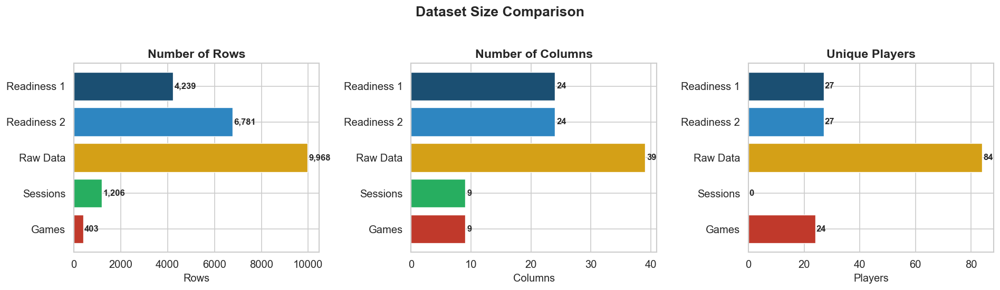

In [4]:
# ── Visual: Dataset sizes comparison ─────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

# Rows
names = [DS_NAMES[k] for k in datasets]
rows  = [df.shape[0] for df in datasets.values()]
cols  = [DS_COLORS[k] for k in datasets]
axes[0].barh(names, rows, color=cols, edgecolor='white', linewidth=0.8)
for i, v in enumerate(rows):
    axes[0].text(v + 50, i, f'{v:,}', va='center', fontsize=10, fontweight='bold')
axes[0].set_title('Number of Rows', fontweight='bold')
axes[0].set_xlabel('Rows')
axes[0].invert_yaxis()

# Columns
ncols = [df.shape[1] for df in datasets.values()]
axes[1].barh(names, ncols, color=cols, edgecolor='white', linewidth=0.8)
for i, v in enumerate(ncols):
    axes[1].text(v + 0.3, i, str(v), va='center', fontsize=10, fontweight='bold')
axes[1].set_title('Number of Columns', fontweight='bold')
axes[1].set_xlabel('Columns')
axes[1].invert_yaxis()

# Players
nplayers = []
for k, df in datasets.items():
    pk = 'Playerkey' if 'Playerkey' in df.columns else 'playerkey'
    nplayers.append(df[pk].nunique() if pk in df.columns else 0)
axes[2].barh(names, nplayers, color=cols, edgecolor='white', linewidth=0.8)
for i, v in enumerate(nplayers):
    axes[2].text(v + 0.3, i, str(v), va='center', fontsize=10, fontweight='bold')
axes[2].set_title('Unique Players', fontweight='bold')
axes[2].set_xlabel('Players')
axes[2].invert_yaxis()

fig.suptitle('Dataset Size Comparison', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

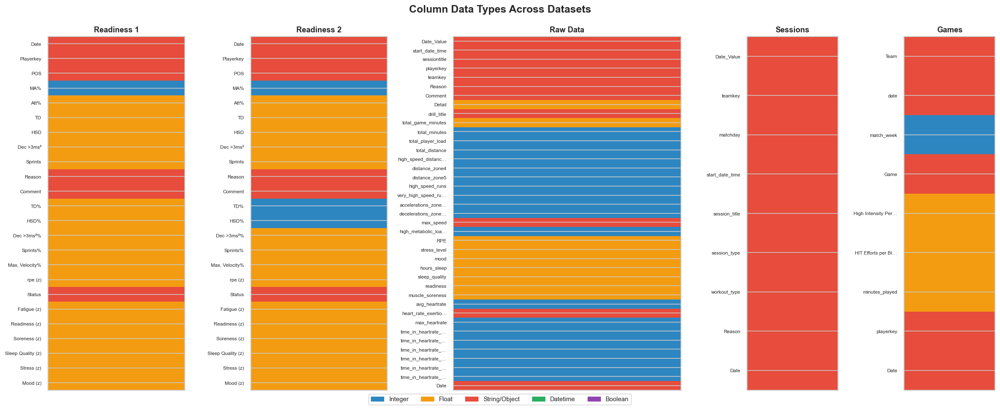

In [5]:
# ── Data types heatmap for each dataset ──────────────────────────────
fig, axes = plt.subplots(1, 5, figsize=(20, 8), gridspec_kw={'width_ratios': [3, 3, 5, 2, 2]})

dtype_map = {'int64': 0, 'float64': 1, 'object': 2, 'datetime64[ns]': 3, 'bool': 4}
dtype_labels = ['Integer', 'Float', 'String/Object', 'Datetime', 'Boolean']
cmap = LinearSegmentedColormap.from_list('dtypes', ['#2E86C1', '#F39C12', '#E74C3C', '#27AE60', '#8E44AD'], N=5)

for ax, (k, df) in zip(axes, datasets.items()):
    dtype_codes = df.dtypes.map(lambda x: dtype_map.get(str(x), 2)).values.reshape(-1, 1)
    col_labels = [c[:18] + '…' if len(c) > 18 else c for c in df.columns]
    ax.imshow(dtype_codes, cmap=cmap, aspect='auto', vmin=0, vmax=4)
    ax.set_yticks(range(len(df.columns)))
    ax.set_yticklabels(col_labels, fontsize=7)
    ax.set_xticks([])
    ax.set_title(DS_NAMES[k], fontsize=11, fontweight='bold')

# Legend
handles = [mpatches.Patch(color=cmap(i / 4), label=l) for i, l in enumerate(dtype_labels)]
fig.legend(handles=handles, loc='lower center', ncol=5, fontsize=9, frameon=True,
           bbox_to_anchor=(0.5, -0.02))
fig.suptitle('Column Data Types Across Datasets', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

<a id='3'></a>
## 3. Missingness Analysis

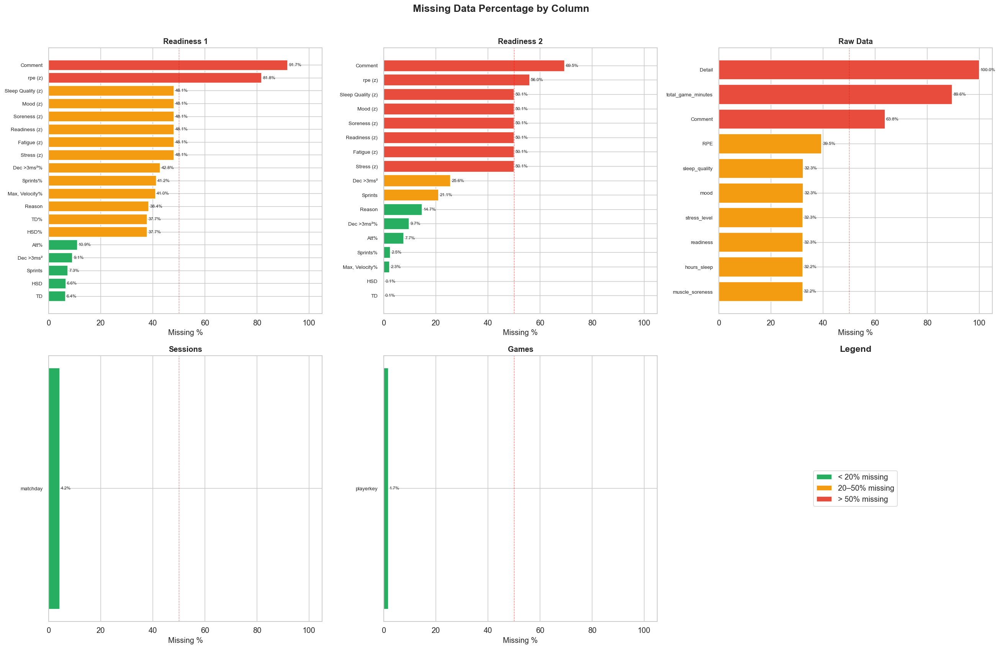

In [6]:
# ── 3.1  Missingness percentage bar charts ──────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(22, 14))
axes = axes.flatten()

for idx, (k, df) in enumerate(datasets.items()):
    ax = axes[idx]
    miss = (df.isnull().sum() / len(df) * 100).sort_values(ascending=True)
    miss = miss[miss > 0]  # only show columns with missing data
    if len(miss) == 0:
        ax.text(0.5, 0.5, 'No missing data!', ha='center', va='center',
                fontsize=14, transform=ax.transAxes)
    else:
        colors = ['#E74C3C' if v > 50 else '#F39C12' if v > 20 else '#27AE60' for v in miss.values]
        bars = ax.barh(range(len(miss)), miss.values, color=colors, edgecolor='white')
        ax.set_yticks(range(len(miss)))
        labels = [c[:22] + '…' if len(c) > 22 else c for c in miss.index]
        ax.set_yticklabels(labels, fontsize=8)
        for i, v in enumerate(miss.values):
            ax.text(v + 0.5, i, f'{v:.1f}%', va='center', fontsize=7)
        ax.axvline(50, color='red', linestyle='--', alpha=0.5, linewidth=0.8)
        ax.set_xlim(0, 105)
    ax.set_title(DS_NAMES[k], fontweight='bold', fontsize=12)
    ax.set_xlabel('Missing %')

# Legend for the threshold colors
axes[5].axis('off')
legend_elements = [
    mpatches.Patch(facecolor='#27AE60', label='< 20% missing'),
    mpatches.Patch(facecolor='#F39C12', label='20–50% missing'),
    mpatches.Patch(facecolor='#E74C3C', label='> 50% missing'),
]
axes[5].legend(handles=legend_elements, loc='center', fontsize=12, frameon=True)
axes[5].set_title('Legend', fontweight='bold')

fig.suptitle('Missing Data Percentage by Column', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

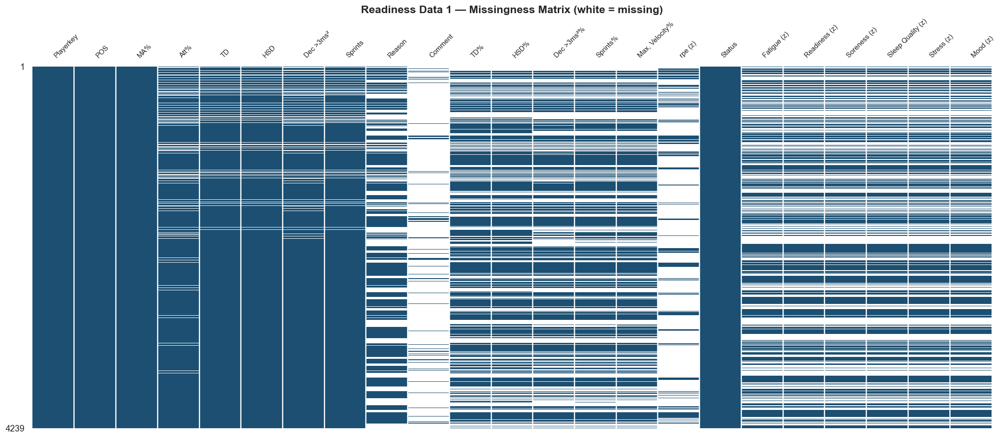

In [7]:
# ── 3.2  Missingno matrix for Readiness_Data1 ───────────────────────
fig, ax = plt.subplots(figsize=(18, 8))
msno.matrix(rd1.drop(columns=['Date']), ax=ax, sparkline=False, fontsize=9, color=(0.11, 0.31, 0.45))
ax.set_title('Readiness Data 1 — Missingness Matrix (white = missing)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

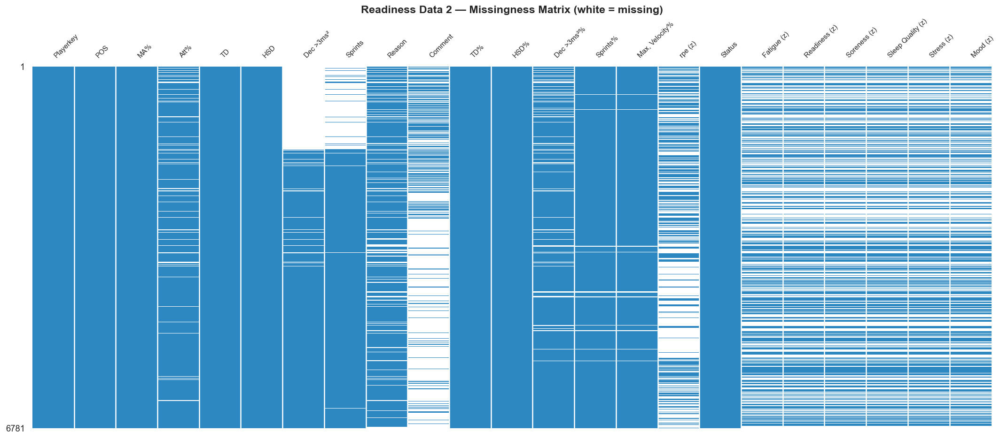

In [8]:
# ── 3.3  Missingno matrix for Readiness_Data2 ───────────────────────
fig, ax = plt.subplots(figsize=(18, 8))
msno.matrix(rd2.drop(columns=['Date']), ax=ax, sparkline=False, fontsize=9, color=(0.18, 0.53, 0.76))
ax.set_title('Readiness Data 2 — Missingness Matrix (white = missing)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

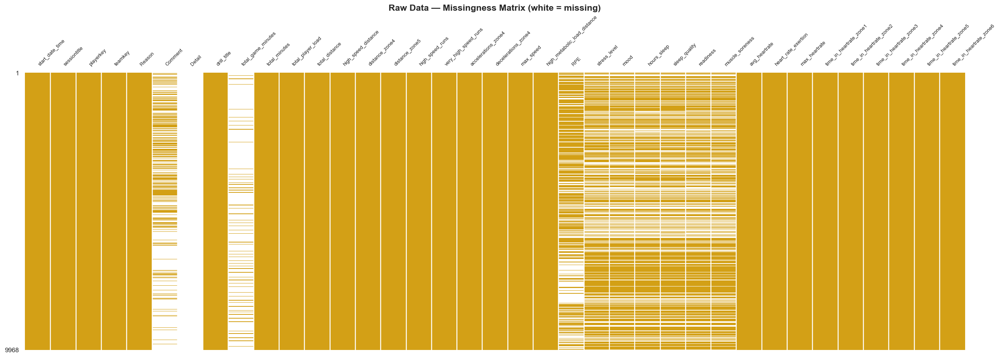

In [9]:
# ── 3.4  Missingno matrix for Raw_Data ───────────────────────────────
fig, ax = plt.subplots(figsize=(22, 8))
msno.matrix(raw.drop(columns=['Date', 'Date_Value']), ax=ax, sparkline=False, fontsize=8,
            color=(0.83, 0.63, 0.09))
ax.set_title('Raw Data — Missingness Matrix (white = missing)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

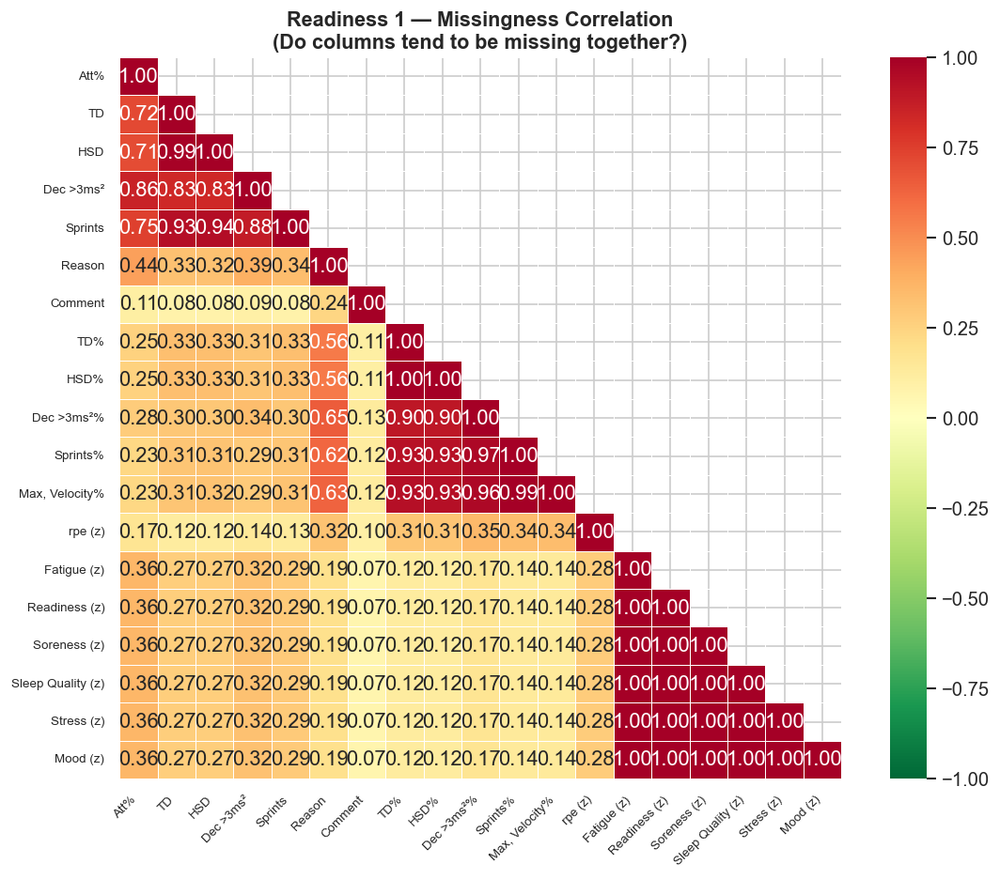

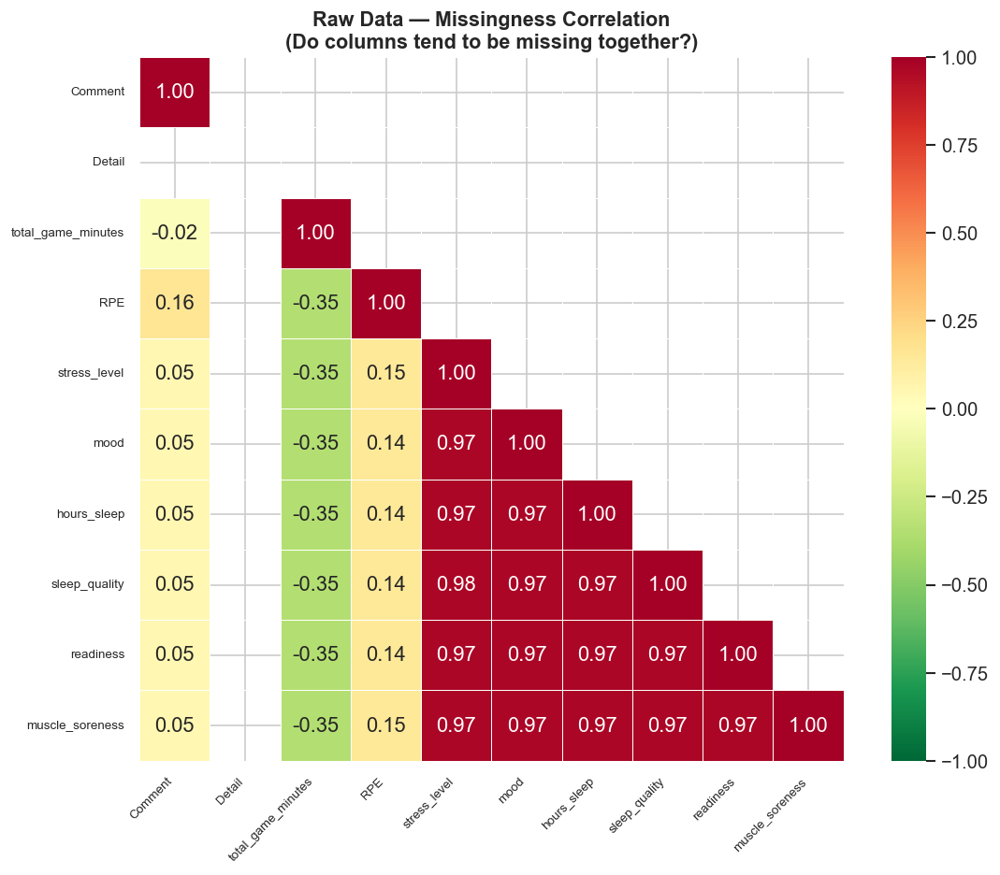

In [10]:
# ── 3.5  Missingness correlation heatmaps ───────────────────────────
for k, df, title in [
    ('rd1', rd1, 'Readiness 1'),
    ('raw', raw, 'Raw Data')
]:
    miss_cols = df.columns[df.isnull().any()]
    if len(miss_cols) > 1:
        fig, ax = plt.subplots(figsize=(10, 8))
        miss_corr = df[miss_cols].isnull().corr()
        mask = np.triu(np.ones_like(miss_corr, dtype=bool), k=1)
        short = [c[:18] + '…' if len(c) > 18 else c for c in miss_cols]
        sns.heatmap(miss_corr, mask=mask, annot=True, fmt='.2f', cmap='RdYlGn_r',
                    vmin=-1, vmax=1, ax=ax, xticklabels=short, yticklabels=short,
                    linewidths=0.5, square=True)
        ax.set_title(f'{title} — Missingness Correlation\n(Do columns tend to be missing together?)',
                     fontsize=13, fontweight='bold')
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(fontsize=8)
        plt.tight_layout()
        plt.show()

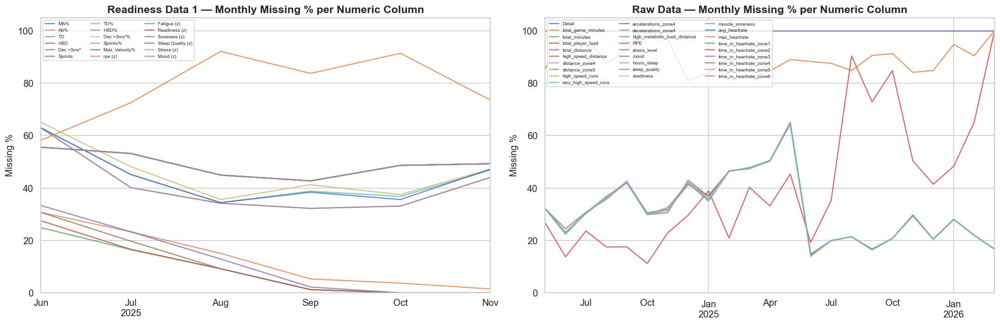

In [11]:
# ── 3.6  Missingness over time (per month) ──────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

for ax, (df, title, pk) in zip(axes, [
    (rd1, 'Readiness Data 1', 'Playerkey'),
    (raw, 'Raw Data', 'playerkey')
]):
    numeric_cols = df.select_dtypes(include='number').columns.tolist()
    monthly = df.set_index('Date')[numeric_cols].resample('ME').apply(
        lambda x: x.isnull().mean() * 100
    )
    monthly.plot(ax=ax, linewidth=1.5, alpha=0.8)
    ax.set_title(f'{title} — Monthly Missing % per Numeric Column', fontweight='bold')
    ax.set_ylabel('Missing %')
    ax.set_xlabel('')
    ax.legend(fontsize=6, ncol=3, loc='upper left')
    ax.set_ylim(0, 105)

plt.tight_layout()
plt.show()

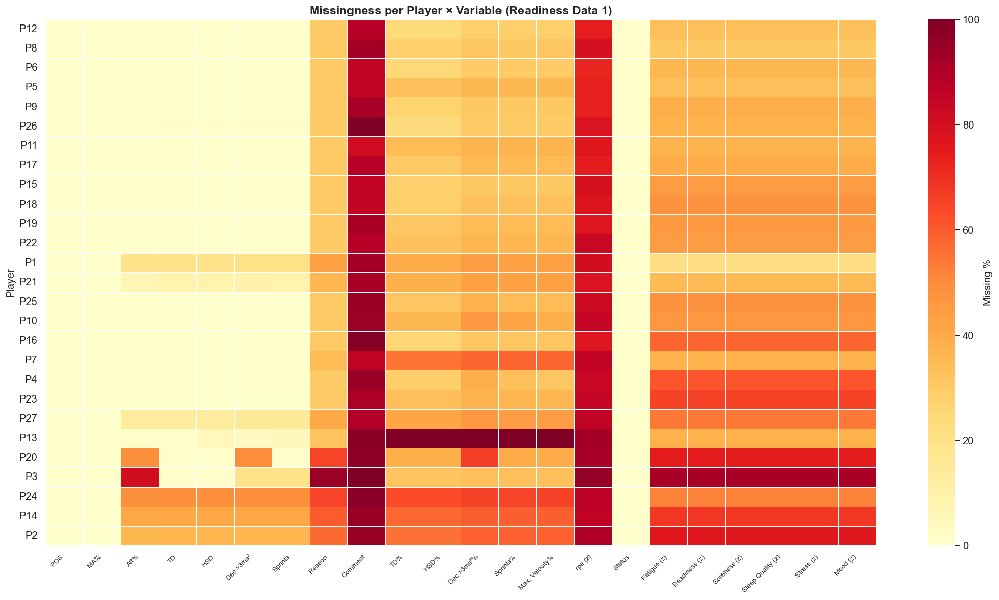

In [12]:
# ── 3.7  Missingness per player (Readiness Data 1) ──────────────────
player_miss = rd1.groupby('Playerkey').apply(
    lambda g: g.isnull().mean() * 100
).drop(columns=['Date', 'Playerkey'], errors='ignore')

# Sort by total missingness
player_miss['_total'] = player_miss.mean(axis=1)
player_miss = player_miss.sort_values('_total', ascending=True)
player_miss = player_miss.drop(columns=['_total'])

# Assign simple player IDs
player_ids = {pk: f'P{i+1}' for i, pk in enumerate(rd1['Playerkey'].unique())}
player_miss.index = player_miss.index.map(player_ids)

fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(player_miss, cmap='YlOrRd', vmin=0, vmax=100, annot=False,
            linewidths=0.3, ax=ax, cbar_kws={'label': 'Missing %'})
ax.set_title('Missingness per Player × Variable (Readiness Data 1)',
             fontsize=14, fontweight='bold')
ax.set_ylabel('Player')
ax.set_xlabel('')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.tight_layout()
plt.show()

<a id='4'></a>
## 4. Dataset Linkage & Relationships

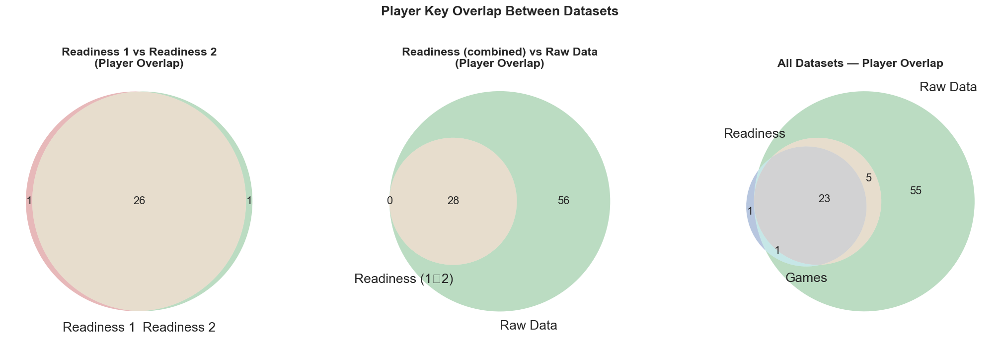

Players in ALL datasets (Readiness ∩ Raw ∩ Games): 23
Players in Raw only (not in Readiness):            56
Players in Readiness only (not in Raw):            0


In [13]:
# ── 4.1  Player key overlaps (Venn diagrams) ────────────────────────
pk_rd1   = set(rd1['Playerkey'].unique())
pk_rd2   = set(rd2['Playerkey'].unique())
pk_raw   = set(raw['playerkey'].unique())
pk_games = set(games['playerkey'].unique())

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# Readiness 1 vs Readiness 2
v1 = venn2([pk_rd1, pk_rd2], set_labels=('Readiness 1', 'Readiness 2'), ax=axes[0])
axes[0].set_title('Readiness 1 vs Readiness 2\n(Player Overlap)', fontweight='bold')

# Readiness (combined) vs Raw Data
pk_readiness = pk_rd1 | pk_rd2
v2 = venn2([pk_readiness, pk_raw], set_labels=('Readiness (1∪2)', 'Raw Data'), ax=axes[1])
axes[1].set_title('Readiness (combined) vs Raw Data\n(Player Overlap)', fontweight='bold')

# Readiness vs Raw vs Games
v3 = venn3([pk_readiness, pk_raw, pk_games],
           set_labels=('Readiness', 'Raw Data', 'Games'), ax=axes[2])
axes[2].set_title('All Datasets — Player Overlap', fontweight='bold')

fig.suptitle('Player Key Overlap Between Datasets', fontsize=16, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

print(f'Players in ALL datasets (Readiness ∩ Raw ∩ Games): {len(pk_readiness & pk_raw & pk_games)}')
print(f'Players in Raw only (not in Readiness):            {len(pk_raw - pk_readiness)}')
print(f'Players in Readiness only (not in Raw):            {len(pk_readiness - pk_raw)}')

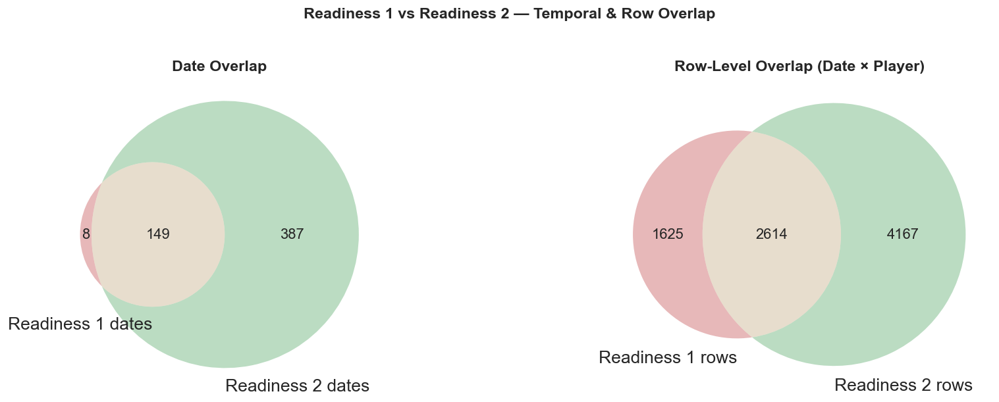

Overlapping dates: 149 / 157 (rd1) / 536 (rd2)
Overlapping rows:  2614 / 4239 (rd1) / 6781 (rd2)


In [14]:
# ── 4.2  Readiness 1 vs Readiness 2: temporal overlap ───────────────
dates_rd1 = set(rd1['Date'].dt.date.unique())
dates_rd2 = set(rd2['Date'].dt.date.unique())

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Date overlap
vd = venn2([dates_rd1, dates_rd2], set_labels=('Readiness 1 dates', 'Readiness 2 dates'), ax=axes[0])
axes[0].set_title('Date Overlap', fontweight='bold')

# Row-level overlap (same Date + Playerkey)
rd1_keys = set(zip(rd1['Date'], rd1['Playerkey']))
rd2_keys = set(zip(rd2['Date'], rd2['Playerkey']))
vr = venn2([rd1_keys, rd2_keys], set_labels=('Readiness 1 rows', 'Readiness 2 rows'), ax=axes[1])
axes[1].set_title('Row-Level Overlap (Date × Player)', fontweight='bold')

fig.suptitle('Readiness 1 vs Readiness 2 — Temporal & Row Overlap',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print(f'Overlapping dates: {len(dates_rd1 & dates_rd2)} / {len(dates_rd1)} (rd1) / {len(dates_rd2)} (rd2)')
print(f'Overlapping rows:  {len(rd1_keys & rd2_keys)} / {len(rd1_keys)} (rd1) / {len(rd2_keys)} (rd2)')

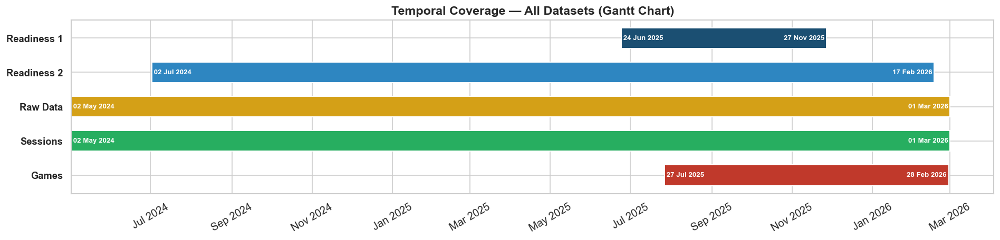

In [15]:
# ── 4.3  Date coverage across all datasets (Gantt-style) ────────────
fig, ax = plt.subplots(figsize=(16, 4))

ds_list = ['rd1', 'rd2', 'raw', 'sess', 'games']
for i, k in enumerate(ds_list):
    df = datasets[k]
    d_min, d_max = df['Date'].min(), df['Date'].max()
    ax.barh(i, (d_max - d_min).days, left=d_min, height=0.6,
            color=DS_COLORS[k], edgecolor='white', linewidth=1.2)
    lbl_min = d_min.strftime('%d %b %Y')
    lbl_max = d_max.strftime('%d %b %Y')
    ax.text(d_min, i, f' {lbl_min}', va='center', ha='left',
            fontsize=8, fontweight='bold', color='white')
    ax.text(d_max, i, f'{lbl_max} ', va='center', ha='right',
            fontsize=8, fontweight='bold', color='white')

ax.set_yticks(range(len(ds_list)))
ax.set_yticklabels([DS_NAMES[k] for k in ds_list], fontsize=11, fontweight='bold')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.set_title('Temporal Coverage \u2014 All Datasets (Gantt Chart)', fontsize=14, fontweight='bold')
ax.invert_yaxis()
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

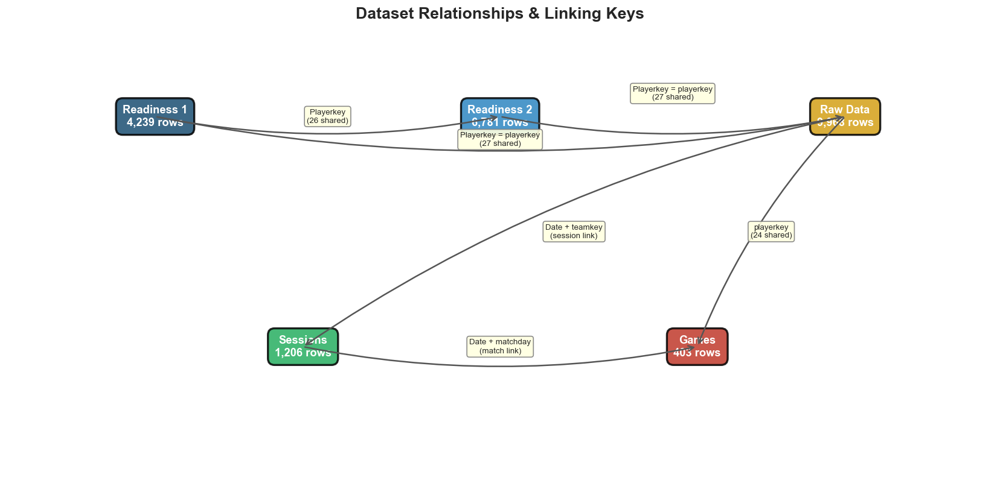

In [16]:
# ── 4.4  Entity-Relationship diagram (text-based) ───────────────────
fig, ax = plt.subplots(figsize=(14, 7))
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.axis('off')

# Boxes for each dataset
positions = {
    'rd1':   (1.5, 8),
    'rd2':   (5.0, 8),
    'raw':   (8.5, 8),
    'sess':  (3.0, 3),
    'games': (7.0, 3)
}

for k, (x, y) in positions.items():
    bp = dict(boxstyle='round,pad=0.6', facecolor=DS_COLORS[k], edgecolor='black',
             linewidth=2, alpha=0.85)
    n_rows = datasets[k].shape[0]
    label = DS_NAMES[k] + '\n' + f'{n_rows:,} rows'
    ax.text(x, y, label,
            ha='center', va='center', fontsize=11, fontweight='bold',
            color='white', bbox=bp)

# Edges with labels
edges = [
    ('rd1', 'rd2', 'Playerkey\n(26 shared)', 0),
    ('rd1', 'raw', 'Playerkey = playerkey\n(27 shared)', -0.5),
    ('rd2', 'raw', 'Playerkey = playerkey\n(27 shared)', 0.5),
    ('raw', 'games', 'playerkey\n(24 shared)', 0),
    ('raw', 'sess', 'Date + teamkey\n(session link)', 0),
    ('sess', 'games', 'Date + matchday\n(match link)', 0),
]

for src, dst, label, offset in edges:
    x1, y1 = positions[src]
    x2, y2 = positions[dst]
    mx, my = (x1 + x2) / 2, (y1 + y2) / 2 + offset
    ax.annotate('', xy=(x2, y2), xytext=(x1, y1),
                arrowprops=dict(arrowstyle='->', color='#555', lw=1.5,
                               connectionstyle='arc3,rad=0.1'))
    ax.text(mx, my, label, ha='center', va='center', fontsize=8,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='lightyellow',
                     edgecolor='gray', alpha=0.9))

ax.set_title('Dataset Relationships & Linking Keys', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [17]:
# ── 4.5  Merge coverage matrix ──────────────────────────────────────
# For each pair of datasets, show how many rows can be linked
pairs = [
    ('Readiness 1', 'Readiness 2', len(rd1_keys & rd2_keys), len(rd1_keys), len(rd2_keys)),
]

# rd1 ↔ raw (by Date + Playerkey)
raw_keys_by_date_pk = set(zip(raw['Date'], raw['playerkey']))
rd1_keys_dp = set(zip(rd1['Date'], rd1['Playerkey']))
pairs.append(('Readiness 1', 'Raw Data',
              len(rd1_keys_dp & raw_keys_by_date_pk), len(rd1_keys_dp), len(raw_keys_by_date_pk)))

# rd1 ↔ games (by Date + Playerkey)
games_keys = set(zip(games['Date'], games['playerkey']))
pairs.append(('Readiness 1', 'Games',
              len(rd1_keys_dp & games_keys), len(rd1_keys_dp), len(games_keys)))

# Raw ↔ Games
pairs.append(('Raw Data', 'Games',
              len(raw_keys_by_date_pk & games_keys), len(raw_keys_by_date_pk), len(games_keys)))

merge_df = pd.DataFrame(pairs, columns=['Dataset A', 'Dataset B', 'Matched Rows',
                                         'Rows A', 'Rows B'])
merge_df['Match % (A)'] = (merge_df['Matched Rows'] / merge_df['Rows A'] * 100).round(1)
merge_df['Match % (B)'] = (merge_df['Matched Rows'] / merge_df['Rows B'] * 100).round(1)

merge_df.style.format({
    'Matched Rows': '{:,}', 'Rows A': '{:,}', 'Rows B': '{:,}',
    'Match % (A)': '{:.1f}%', 'Match % (B)': '{:.1f}%'
}).set_caption('Row-Level Merge Coverage (by Date × Playerkey)')

,Dataset A,Dataset B,Matched Rows,Rows A,Rows B,Match % (A),Match % (B)
0,Readiness 1,Readiness 2,"2,614","4,239","6,781",61.7%,38.5%
1,Readiness 1,Raw Data,"1,942","4,239","9,599",45.8%,20.2%
2,Readiness 1,Games,220,"4,239",400,5.2%,55.0%
3,Raw Data,Games,349,"9,599",400,3.6%,87.2%


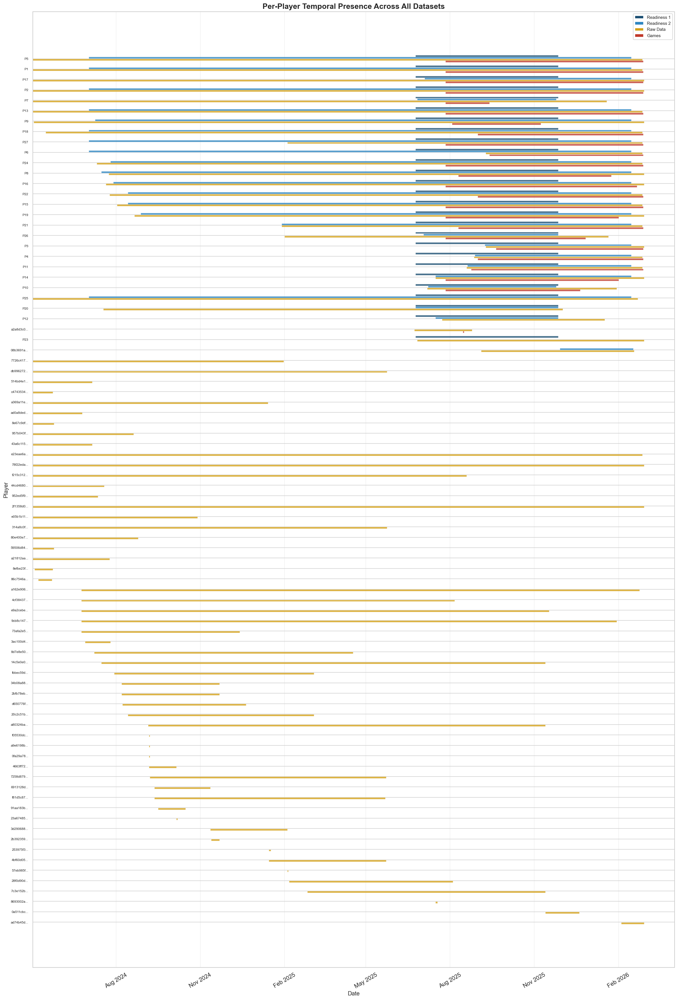


Total unique players across all datasets: 84
Players in all 4 player-level datasets:  23
Players in 3 datasets:                   3
Players in 2 datasets:                   3
Players in 1 dataset only:               55


In [18]:
# ── 4.6  Per-Player Temporal Presence Across Datasets ────────────────
# For every identifiable player, show which date ranges they appear in
# across each dataset — a horizontal timeline per player per dataset.

# Build a player ID mapping (Playerkey -> readable label)
# This is built here so section 4.6 is self-contained
players_rd1 = rd1['Playerkey'].unique()
pid_map = {pk: f'P{i+1}' for i, pk in enumerate(sorted(players_rd1))}

# Build a unified player key set across all datasets
all_player_keys = set()
pk_sources = {}  # {playerkey: {dataset_name: (min_date, max_date, n_rows)}}

for ds_key, ds_label in [('rd1', 'Readiness 1'), ('rd2', 'Readiness 2'),
                          ('raw', 'Raw Data'), ('games', 'Games')]:
    df = datasets[ds_key]
    pk_col = 'Playerkey' if 'Playerkey' in df.columns else 'playerkey'
    if pk_col not in df.columns:
        continue
    for pk in df[pk_col].dropna().unique():
        all_player_keys.add(pk)
        sub = df[df[pk_col] == pk]
        if ds_key not in pk_sources:
            pk_sources.setdefault(pk, {})[ds_label] = (
                sub['Date'].min(), sub['Date'].max(), len(sub)
            )
        else:
            pk_sources.setdefault(pk, {})[ds_label] = (
                sub['Date'].min(), sub['Date'].max(), len(sub)
            )

# Sort players: first by number of datasets they appear in (desc), then by earliest date
player_info = []
for pk in all_player_keys:
    sources = pk_sources.get(pk, {})
    n_ds = len(sources)
    earliest = min(v[0] for v in sources.values())
    # Try to get a readable ID
    if pk in pid_map:
        label = pid_map[pk]
    else:
        label = pk[:8] + '...'
    player_info.append((pk, label, n_ds, earliest))

player_info.sort(key=lambda x: (-x[2], x[3]))

# ── Plot: one row per player, one coloured bar per dataset ──
ds_order = ['Readiness 1', 'Readiness 2', 'Raw Data', 'Games']
ds_color_map = {
    'Readiness 1': OHL_BLUE,
    'Readiness 2': '#2E86C1',
    'Raw Data': OHL_AMBER,
    'Games': OHL_RED,
}

n_players = len(player_info)
fig_height = max(12, n_players * 0.35)
fig, ax = plt.subplots(figsize=(20, fig_height))

bar_height = 0.18
for row_idx, (pk, label, n_ds, _) in enumerate(player_info):
    sources = pk_sources.get(pk, {})
    for ds_idx, ds_name in enumerate(ds_order):
        if ds_name in sources:
            d_min, d_max, n_rows = sources[ds_name]
            y_pos = row_idx + (ds_idx - 1.5) * bar_height
            width = max((d_max - d_min).days, 1)  # at least 1 day visible
            ax.barh(y_pos, width, left=d_min, height=bar_height * 0.9,
                    color=ds_color_map[ds_name], alpha=0.8, edgecolor='white', linewidth=0.3)

ax.set_yticks(range(n_players))
ax.set_yticklabels([info[1] for info in player_info], fontsize=7)
ax.invert_yaxis()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.xticks(rotation=30)

# Legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=ds_color_map[ds], label=ds) for ds in ds_order]
ax.legend(handles=legend_elements, loc='upper right', fontsize=9, framealpha=0.9)

ax.set_title('Per-Player Temporal Presence Across All Datasets', fontsize=16, fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Player')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# ── Summary table: which players appear in which datasets ──
print(f'\nTotal unique players across all datasets: {n_players}')
print(f'Players in all 4 player-level datasets:  {sum(1 for _, _, n, _ in player_info if n == 4)}')
print(f'Players in 3 datasets:                   {sum(1 for _, _, n, _ in player_info if n == 3)}')
print(f'Players in 2 datasets:                   {sum(1 for _, _, n, _ in player_info if n == 2)}')
print(f'Players in 1 dataset only:               {sum(1 for _, _, n, _ in player_info if n == 1)}')

<a id='5'></a>
## 5. Temporal Coverage & Timelines

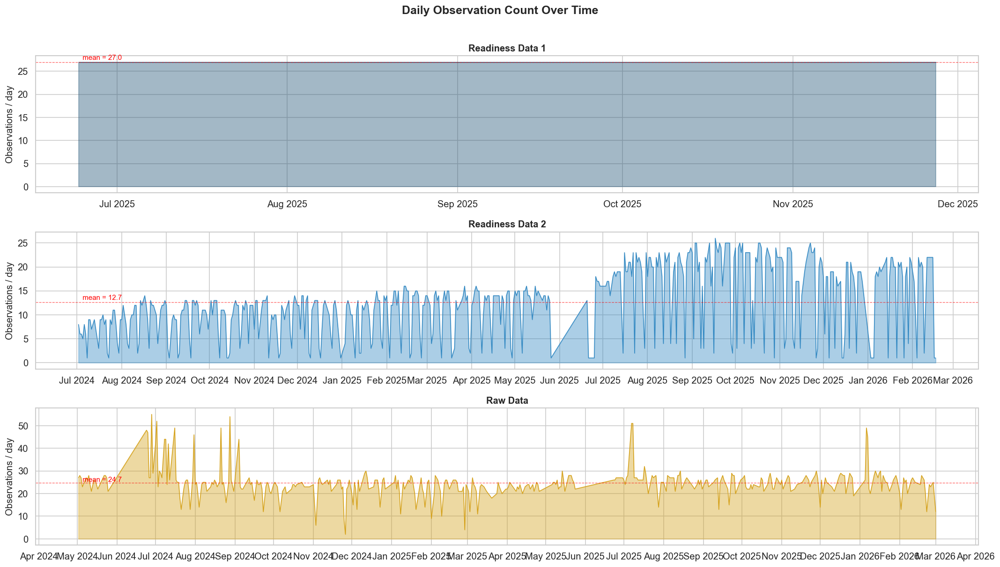

In [19]:
# ── 5.1  Daily observation counts across datasets ───────────────────
fig, axes = plt.subplots(3, 1, figsize=(18, 10), sharex=False)

for ax, (k, title) in zip(axes, [
    ('rd1', 'Readiness Data 1'),
    ('rd2', 'Readiness Data 2'),
    ('raw', 'Raw Data')
]):
    df = datasets[k]
    daily = df.groupby('Date').size()
    ax.fill_between(daily.index, daily.values, alpha=0.4, color=DS_COLORS[k])
    ax.plot(daily.index, daily.values, linewidth=0.8, color=DS_COLORS[k])
    ax.set_ylabel('Observations / day')
    ax.set_title(title, fontweight='bold', fontsize=12)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    mean_val = daily.mean()
    ax.axhline(mean_val, color='red', linestyle='--', alpha=0.6, linewidth=0.8)
    ax.text(daily.index[0], mean_val + 0.5, f'  mean = {mean_val:.1f}',
            color='red', fontsize=9)

fig.suptitle('Daily Observation Count Over Time', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

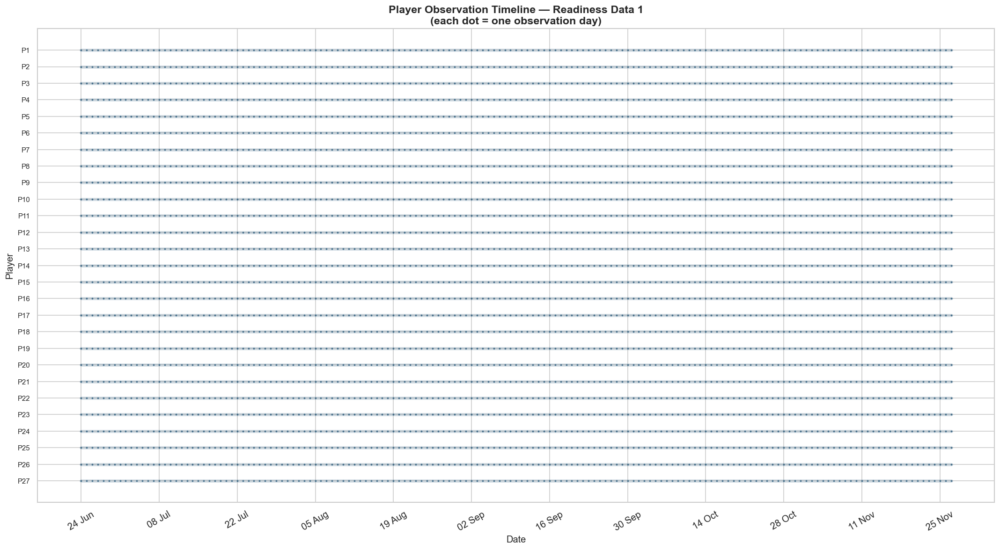

In [20]:
# ── 5.2  Player activity timeline (Readiness 1) ─────────────────────
# Each player's observed dates as a horizontal line
players_rd1 = sorted(rd1['Playerkey'].unique(), key=lambda p: rd1[rd1['Playerkey']==p]['Date'].min())
pid_map = {pk: f'P{i+1}' for i, pk in enumerate(players_rd1)}

fig, ax = plt.subplots(figsize=(18, 10))
for i, pk in enumerate(players_rd1):
    dates = rd1[rd1['Playerkey'] == pk]['Date'].sort_values()
    ax.scatter(dates, [i] * len(dates), s=2, color=OHL_BLUE, alpha=0.6)
    ax.plot([dates.min(), dates.max()], [i, i], color=OHL_BLUE, alpha=0.2, linewidth=4)

ax.set_yticks(range(len(players_rd1)))
ax.set_yticklabels([pid_map[pk] for pk in players_rd1], fontsize=9)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=2))
ax.set_title('Player Observation Timeline — Readiness Data 1\n(each dot = one observation day)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Player')
ax.invert_yaxis()
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

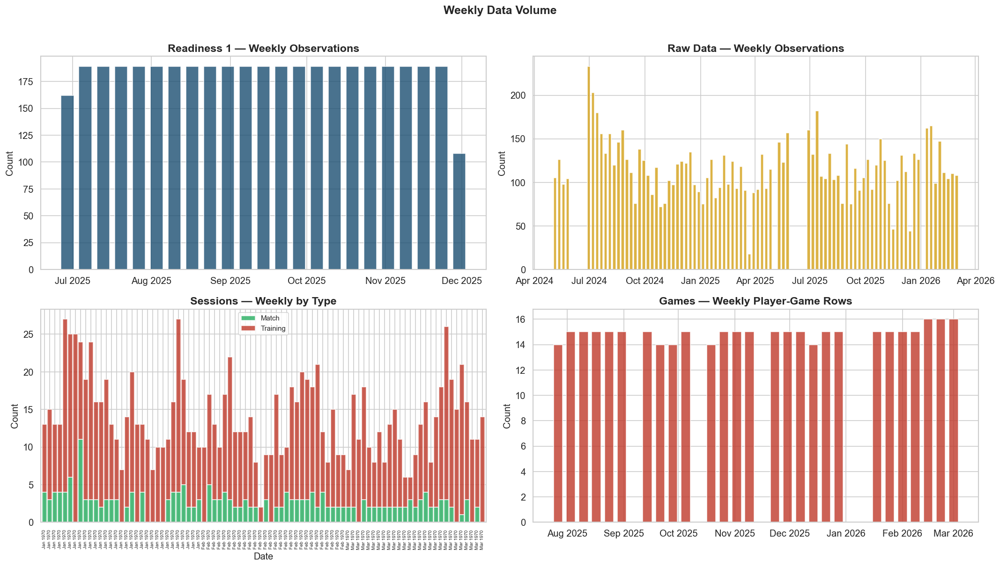

In [21]:
# ── 5.3  Weekly aggregated volume ───────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Readiness 1: weekly rows
weekly_rd1 = rd1.set_index('Date').resample('W').size()
axes[0, 0].bar(weekly_rd1.index, weekly_rd1.values, width=5, color=OHL_BLUE, alpha=0.8)
axes[0, 0].set_title('Readiness 1 — Weekly Observations', fontweight='bold')
axes[0, 0].set_ylabel('Count')

# Raw Data: weekly rows
weekly_raw = raw.set_index('Date').resample('W').size()
axes[0, 1].bar(weekly_raw.index, weekly_raw.values, width=5, color=OHL_AMBER, alpha=0.8)
axes[0, 1].set_title('Raw Data — Weekly Observations', fontweight='bold')
axes[0, 1].set_ylabel('Count')

# Sessions: weekly count by type
sess_weekly = sess.set_index('Date').groupby([pd.Grouper(freq='W'), 'session_type']).size().unstack(fill_value=0)
sess_weekly.plot.bar(stacked=True, ax=axes[1, 0], color=[OHL_GREEN, OHL_RED], width=0.9, alpha=0.8)
axes[1, 0].set_title('Sessions — Weekly by Type', fontweight='bold')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', labelsize=6)
axes[1, 0].legend(fontsize=9)

# Games: weekly games
weekly_games = games.set_index('Date').resample('W').size()
axes[1, 1].bar(weekly_games.index, weekly_games.values, width=5, color=OHL_RED, alpha=0.8)
axes[1, 1].set_title('Games — Weekly Player-Game Rows', fontweight='bold')
axes[1, 1].set_ylabel('Count')

for ax in axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

fig.suptitle('Weekly Data Volume', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

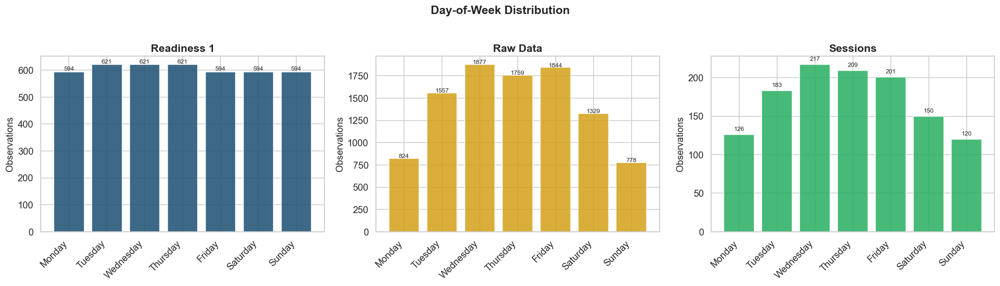

In [22]:
# ── 5.4  Day-of-week distribution ───────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
dow_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for ax, (k, title) in zip(axes, [
    ('rd1', 'Readiness 1'),
    ('raw', 'Raw Data'),
    ('sess', 'Sessions')
]):
    df = datasets[k]
    dow = df['Date'].dt.day_name().value_counts().reindex(dow_order)
    bars = ax.bar(dow_order, dow.values, color=DS_COLORS[k], alpha=0.85, edgecolor='white')
    ax.set_title(title, fontweight='bold')
    ax.set_ylabel('Observations')
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    for bar, val in zip(bars, dow.values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                str(val), ha='center', fontsize=8)

fig.suptitle('Day-of-Week Distribution', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

<a id='6'></a>
## 6. Readiness Data Deep Dive

Analysis of wellness z-scores, ACWR, GPS benchmarks, medical status, and activity patterns from both Readiness datasets.

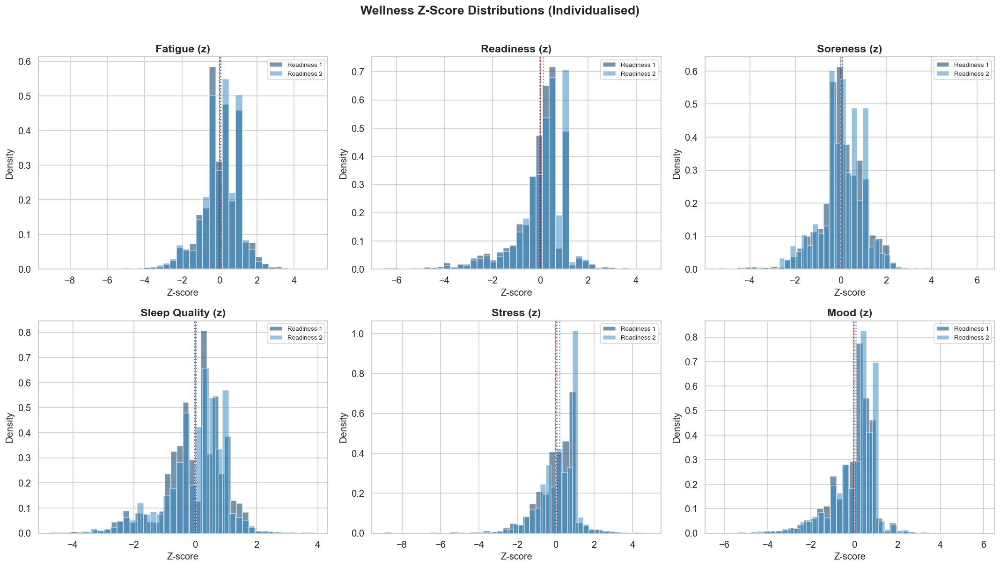

In [23]:
# ── 6.1  Wellness z-score distributions ──────────────────────────────
wellness_cols = ['Fatigue (z)', 'Readiness (z)', 'Soreness (z)',
                 'Sleep Quality (z)', 'Stress (z)', 'Mood (z)']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax, col in zip(axes.flatten(), wellness_cols):
    data_rd1 = rd1[col].dropna()
    data_rd2 = rd2[col].dropna()
    ax.hist(data_rd1, bins=40, alpha=0.6, color=OHL_BLUE, label='Readiness 1', density=True, edgecolor='white')
    ax.hist(data_rd2, bins=40, alpha=0.5, color='#2E86C1', label='Readiness 2', density=True, edgecolor='white')
    ax.axvline(0, color='red', linestyle='--', alpha=0.7, linewidth=1)
    ax.set_title(col, fontweight='bold')
    ax.set_xlabel('Z-score')
    ax.set_ylabel('Density')
    ax.legend(fontsize=8)
    # Annotate mean
    ax.axvline(data_rd1.mean(), color=OHL_BLUE, linestyle=':', alpha=0.8)
    ax.axvline(data_rd2.mean(), color='#2E86C1', linestyle=':', alpha=0.8)

fig.suptitle('Wellness Z-Score Distributions (Individualised)', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

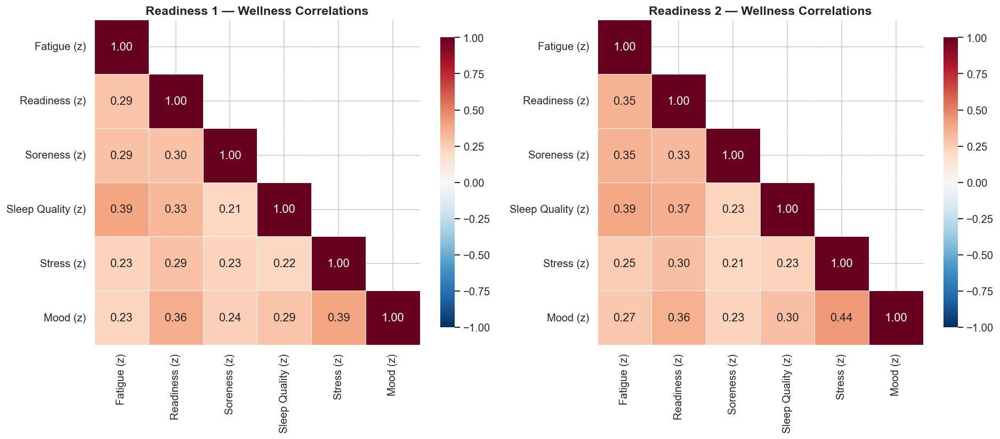

In [24]:
# ── 6.2  Wellness z-score correlation matrix ─────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
for ax, (df, title) in zip(axes, [(rd1, 'Readiness 1'), (rd2, 'Readiness 2')]):
    corr = df[wellness_cols].corr()
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
                vmin=-1, vmax=1, ax=ax, linewidths=0.5, square=True,
                cbar_kws={'shrink': 0.8})
    ax.set_title(f'{title} — Wellness Correlations', fontweight='bold')

plt.tight_layout()
plt.show()

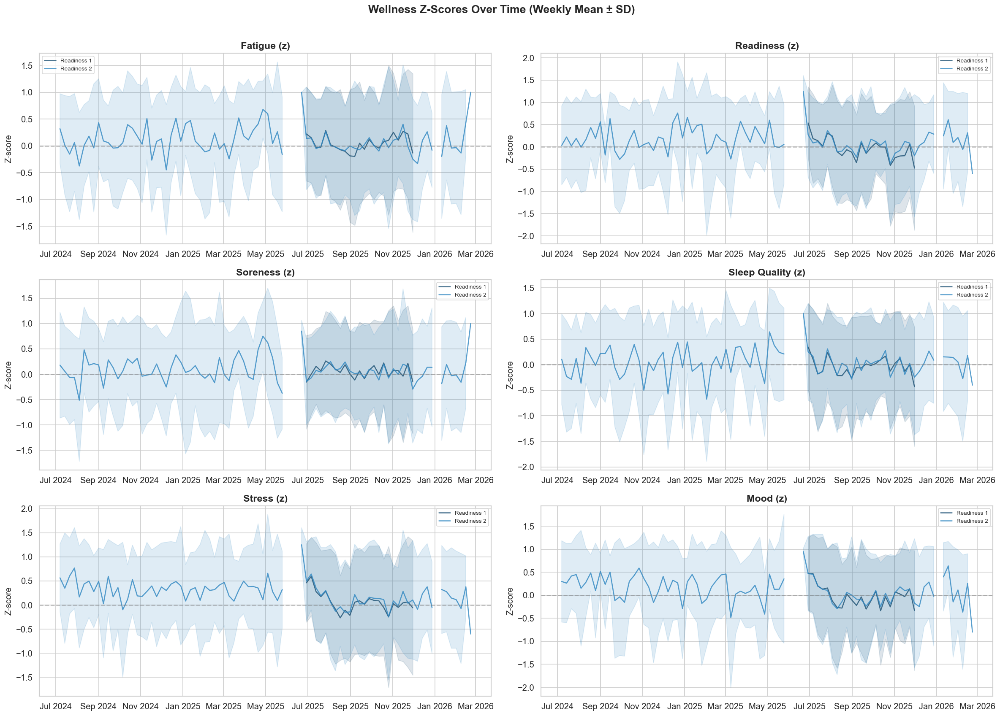

In [25]:
# ── 6.3  Wellness z-scores over time (weekly rolling mean) ──────────
fig, axes = plt.subplots(3, 2, figsize=(20, 14))
for ax, col in zip(axes.flatten(), wellness_cols):
    for df, label, color in [(rd1, 'Readiness 1', OHL_BLUE), (rd2, 'Readiness 2', '#2E86C1')]:
        weekly = df.set_index('Date')[col].resample('W').mean()
        ax.plot(weekly.index, weekly.values, label=label, color=color, linewidth=1.5, alpha=0.8)
        # Confidence band
        weekly_std = df.set_index('Date')[col].resample('W').std()
        ax.fill_between(weekly.index, weekly.values - weekly_std.values,
                        weekly.values + weekly_std.values, alpha=0.15, color=color)
    ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(col, fontweight='bold')
    ax.set_ylabel('Z-score')
    ax.legend(fontsize=8)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

fig.suptitle('Wellness Z-Scores Over Time (Weekly Mean ± SD)', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

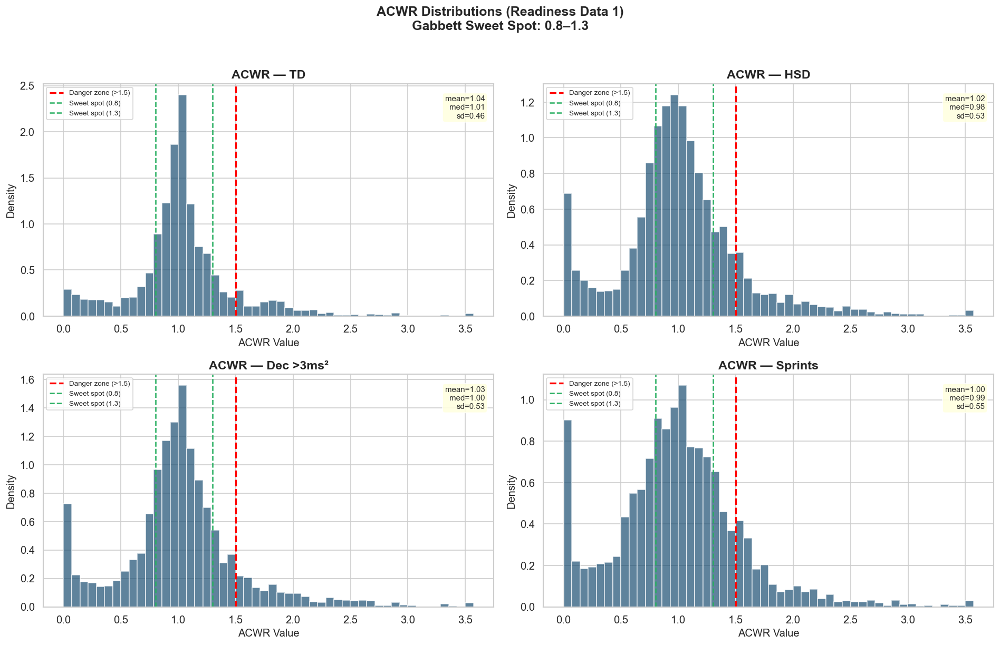

In [26]:
# ── 6.4  ACWR distributions ──────────────────────────────────────────
acwr_cols = ['TD', 'HSD', 'Dec >3ms²', 'Sprints']
# These are the raw ACWR columns in the readiness data

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
for ax, col in zip(axes.flatten(), acwr_cols):
    if col in rd1.columns:
        data = rd1[col].dropna()
        ax.hist(data, bins=50, alpha=0.7, color=OHL_BLUE, edgecolor='white', density=True)
        # Mark danger zones
        if data.max() > 1.5:
            ax.axvline(1.5, color='red', linestyle='--', linewidth=2, label='Danger zone (>1.5)')
            ax.axvline(0.8, color=OHL_GREEN, linestyle='--', linewidth=1.5, label='Sweet spot (0.8)')
            ax.axvline(1.3, color=OHL_GREEN, linestyle='--', linewidth=1.5, label='Sweet spot (1.3)')
        ax.set_title(f'ACWR — {col}', fontweight='bold')
        ax.set_xlabel('ACWR Value')
        ax.set_ylabel('Density')
        ax.legend(fontsize=8)
        # Stats annotation
        ax.text(0.98, 0.95, f'mean={data.mean():.2f}\nmed={data.median():.2f}\nsd={data.std():.2f}',
                transform=ax.transAxes, ha='right', va='top', fontsize=9,
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))

fig.suptitle('ACWR Distributions (Readiness Data 1)\nGabbett Sweet Spot: 0.8–1.3',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

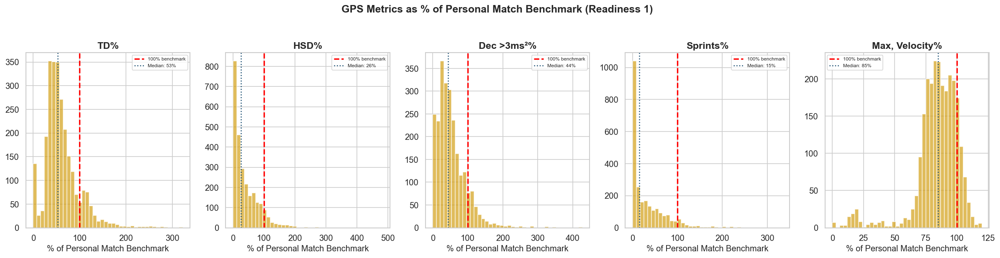

In [27]:
# ── 6.5  GPS Benchmark percentages ───────────────────────────────────
gps_pct_cols = ['TD%', 'HSD%', 'Dec >3ms²%', 'Sprints%', 'Max, Velocity%']
# Filter to columns that exist
gps_pct_cols = [c for c in gps_pct_cols if c in rd1.columns]

fig, axes = plt.subplots(1, len(gps_pct_cols), figsize=(20, 5))
for ax, col in zip(axes, gps_pct_cols):
    data = rd1[col].dropna()
    ax.hist(data, bins=40, alpha=0.7, color=OHL_AMBER, edgecolor='white')
    ax.axvline(100, color='red', linestyle='--', linewidth=2, label='100% benchmark')
    ax.axvline(data.median(), color=OHL_BLUE, linestyle=':', linewidth=1.5, label=f'Median: {data.median():.0f}%')
    ax.set_title(col, fontweight='bold')
    ax.set_xlabel('% of Personal Match Benchmark')
    ax.legend(fontsize=7)

fig.suptitle('GPS Metrics as % of Personal Match Benchmark (Readiness 1)',
             fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

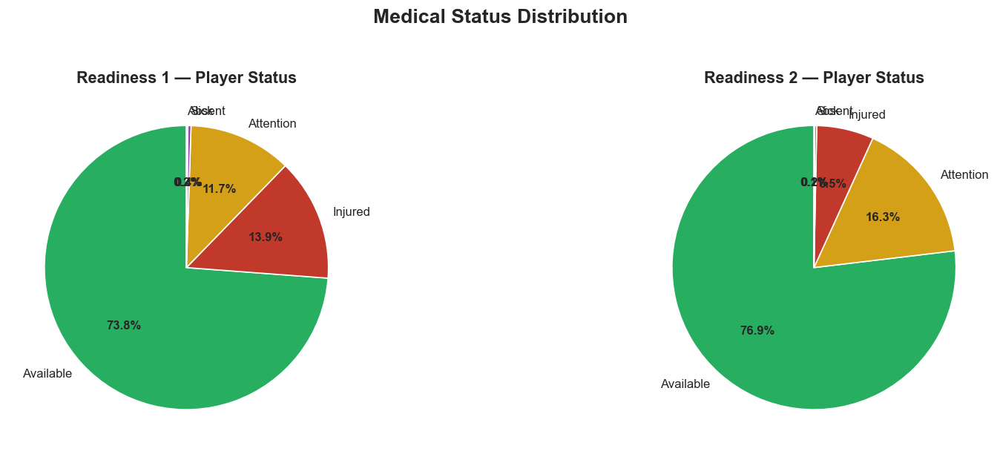

In [28]:
# ── 6.6  Medical Status distribution ─────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for ax, (df, title) in zip(axes, [(rd1, 'Readiness 1'), (rd2, 'Readiness 2')]):
    status_counts = df['Status'].value_counts()
    status_colors = {'Available': OHL_GREEN, 'Attention': OHL_AMBER,
                     'Injured': OHL_RED, 'Sick': OHL_PURPLE, 'Absent': '#95A5A6'}
    colors = [status_colors.get(s, '#999') for s in status_counts.index]
    wedges, texts, autotexts = ax.pie(status_counts.values, labels=status_counts.index,
                                       autopct='%1.1f%%', colors=colors, startangle=90,
                                       textprops={'fontsize': 10})
    for t in autotexts:
        t.set_fontweight('bold')
    ax.set_title(f'{title} — Player Status', fontweight='bold', fontsize=13)

fig.suptitle('Medical Status Distribution', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

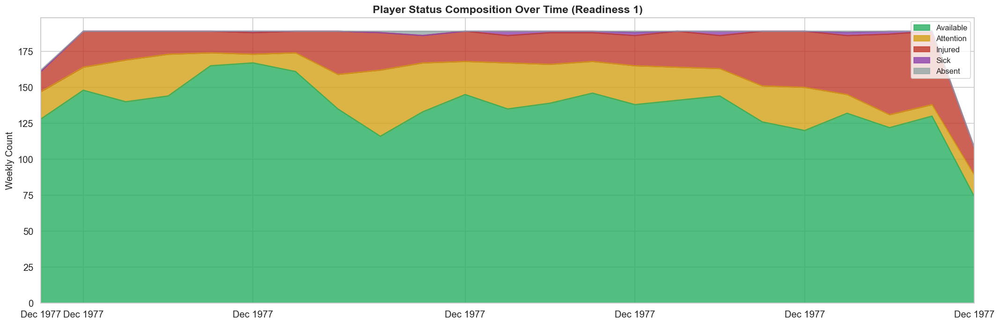

In [29]:
# ── 6.7  Status transitions over time ────────────────────────────────
fig, ax = plt.subplots(figsize=(18, 6))

status_order = ['Available', 'Attention', 'Injured', 'Sick', 'Absent']
status_weekly = rd1.set_index('Date').groupby([pd.Grouper(freq='W'), 'Status']).size().unstack(fill_value=0)
# Reorder columns
status_weekly = status_weekly.reindex(columns=[c for c in status_order if c in status_weekly.columns])

status_colors_list = [OHL_GREEN, OHL_AMBER, OHL_RED, OHL_PURPLE, '#95A5A6']
status_weekly.plot.area(stacked=True, ax=ax, alpha=0.8,
                         color=status_colors_list[:len(status_weekly.columns)])
ax.set_title('Player Status Composition Over Time (Readiness 1)', fontsize=14, fontweight='bold')
ax.set_ylabel('Weekly Count')
ax.set_xlabel('')
ax.legend(loc='upper right', fontsize=10)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.tight_layout()
plt.show()

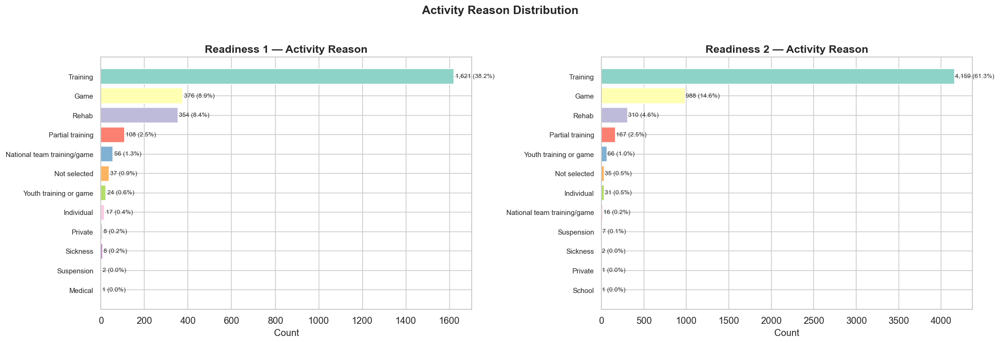

In [30]:
# ── 6.8  Activity reason breakdown ───────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

for ax, (df, title) in zip(axes, [(rd1, 'Readiness 1'), (rd2, 'Readiness 2')]):
    reason_counts = df['Reason'].value_counts().head(12)
    colors = sns.color_palette('Set3', len(reason_counts))
    bars = ax.barh(range(len(reason_counts)), reason_counts.values,
                   color=colors, edgecolor='white')
    ax.set_yticks(range(len(reason_counts)))
    ax.set_yticklabels(reason_counts.index, fontsize=9)
    for i, v in enumerate(reason_counts.values):
        pct = v / len(df) * 100
        ax.text(v + 5, i, f'{v:,} ({pct:.1f}%)', va='center', fontsize=8)
    ax.set_title(f'{title} — Activity Reason', fontweight='bold')
    ax.set_xlabel('Count')
    ax.invert_yaxis()

fig.suptitle('Activity Reason Distribution', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

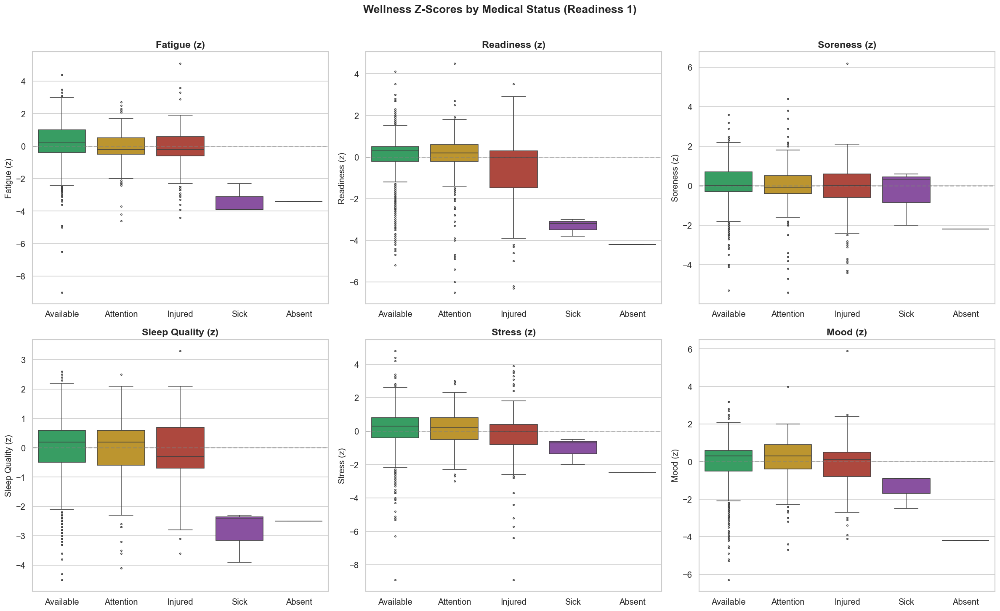

In [31]:
# ── 6.9  Wellness by Status (boxplots) ───────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
for ax, col in zip(axes.flatten(), wellness_cols):
    data = rd1[['Status', col]].dropna()
    order = ['Available', 'Attention', 'Injured', 'Sick', 'Absent']
    order = [s for s in order if s in data['Status'].unique()]
    palette = {s: c for s, c in zip(['Available', 'Attention', 'Injured', 'Sick', 'Absent'],
               [OHL_GREEN, OHL_AMBER, OHL_RED, OHL_PURPLE, '#95A5A6'])}
    sns.boxplot(data=data, x='Status', y=col, order=order, palette=palette, ax=ax,
                showfliers=True, fliersize=2)
    ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(col, fontweight='bold')
    ax.set_xlabel('')

fig.suptitle('Wellness Z-Scores by Medical Status (Readiness 1)',
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

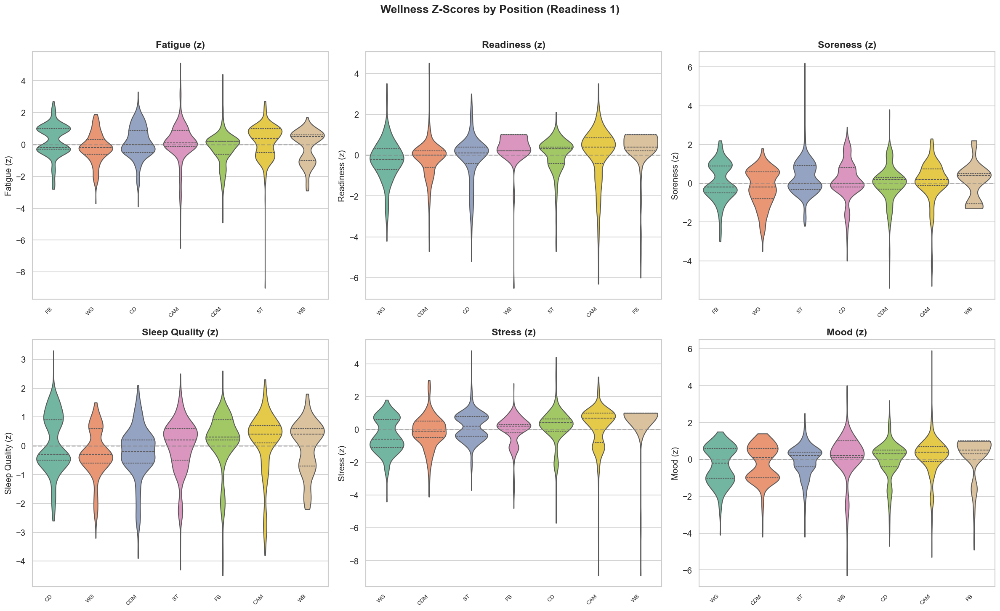

In [32]:
# ── 6.10  Position-level wellness comparison ─────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
for ax, col in zip(axes.flatten(), wellness_cols):
    data = rd1[['POS', col]].dropna()
    pos_order = data.groupby('POS')[col].median().sort_values().index.tolist()
    sns.violinplot(data=data, x='POS', y=col, order=pos_order, ax=ax,
                   palette='Set2', inner='quartile', cut=0)
    ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(col, fontweight='bold')
    ax.set_xlabel('')
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', fontsize=8)

fig.suptitle('Wellness Z-Scores by Position (Readiness 1)',
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

<a id='7'></a>
## 7. Raw GPS & Physical Data

Deep analysis of the Raw_Data.xlsx dataset: GPS metrics, heart rate zones, player load, and subjective measures.

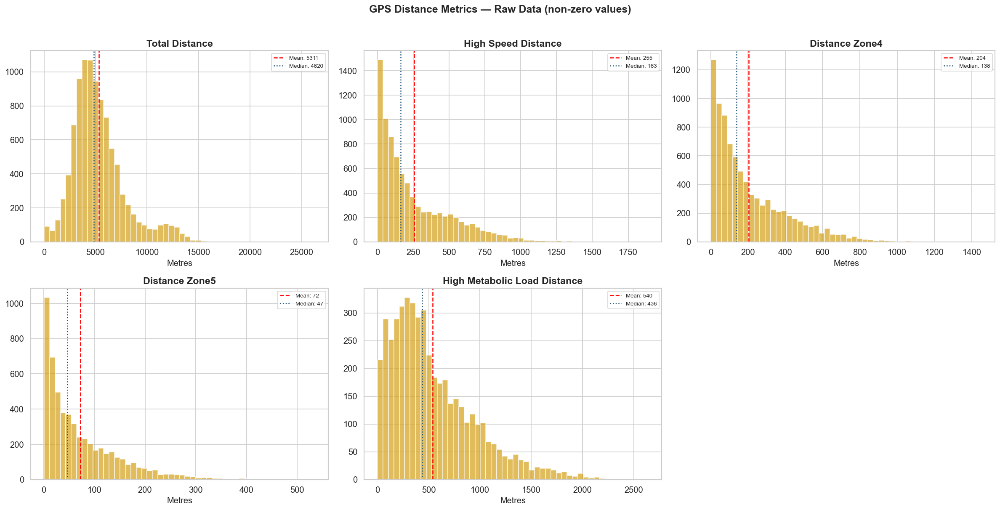

In [33]:
# ── 7.1  GPS distance metrics distributions ──────────────────────────
gps_dist_cols = ['total_distance', 'high_speed_distance', 'distance_zone4',
                 'distance_zone5', 'high_metabolic_load_distance']

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, col in zip(axes.flatten()[:5], gps_dist_cols):
    data = raw[col].dropna()
    data = data[data > 0]  # Remove zero entries
    ax.hist(data, bins=50, alpha=0.7, color=OHL_AMBER, edgecolor='white')
    ax.axvline(data.mean(), color='red', linestyle='--', label=f'Mean: {data.mean():.0f}')
    ax.axvline(data.median(), color=OHL_BLUE, linestyle=':', label=f'Median: {data.median():.0f}')
    ax.set_title(col.replace('_', ' ').title(), fontweight='bold')
    ax.set_xlabel('Metres')
    ax.legend(fontsize=8)
axes.flatten()[5].axis('off')

fig.suptitle('GPS Distance Metrics — Raw Data (non-zero values)',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

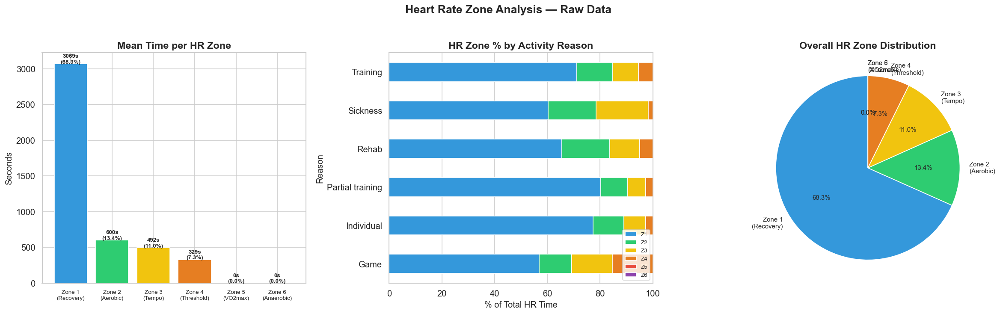

In [34]:
# ── 7.2  Heart Rate Zone time distribution ───────────────────────────
hr_cols = ['time_in_heartrate_zone1', 'time_in_heartrate_zone2', 'time_in_heartrate_zone3',
           'time_in_heartrate_zone4', 'time_in_heartrate_zone5', 'time_in_heartrate_zone6']
hr_labels = ['Zone 1\n(Recovery)', 'Zone 2\n(Aerobic)', 'Zone 3\n(Tempo)',
             'Zone 4\n(Threshold)', 'Zone 5\n(VO2max)', 'Zone 6\n(Anaerobic)']
hr_colors = ['#3498DB', '#2ECC71', '#F1C40F', '#E67E22', '#E74C3C', '#8E44AD']

# Mean time in each zone
mean_times = [raw[c].mean() for c in hr_cols]
total_time = sum(mean_times)
pct_times = [t / total_time * 100 for t in mean_times]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Bar chart
axes[0].bar(hr_labels, mean_times, color=hr_colors, edgecolor='white')
for i, (v, p) in enumerate(zip(mean_times, pct_times)):
    axes[0].text(i, v + 5, f'{v:.0f}s\n({p:.1f}%)', ha='center', fontsize=8, fontweight='bold')
axes[0].set_title('Mean Time per HR Zone', fontweight='bold')
axes[0].set_ylabel('Seconds')
plt.setp(axes[0].xaxis.get_majorticklabels(), fontsize=8)

# Stacked proportion per session type
if 'Reason' in raw.columns:
    reason_hr = raw.groupby('Reason')[hr_cols].mean()
    top_reasons = raw['Reason'].value_counts().head(6).index
    reason_hr = reason_hr.loc[reason_hr.index.isin(top_reasons)]
    # Normalize to percentages
    reason_hr_pct = reason_hr.div(reason_hr.sum(axis=1), axis=0) * 100
    reason_hr_pct.plot.barh(stacked=True, ax=axes[1], color=hr_colors, edgecolor='white')
    axes[1].set_title('HR Zone % by Activity Reason', fontweight='bold')
    axes[1].set_xlabel('% of Total HR Time')
    axes[1].legend(labels=[f'Z{i+1}' for i in range(6)], fontsize=8, loc='lower right')

# Pie chart of overall zone split
axes[2].pie(mean_times, labels=hr_labels, autopct='%1.1f%%', colors=hr_colors,
            startangle=90, textprops={'fontsize': 9})
axes[2].set_title('Overall HR Zone Distribution', fontweight='bold')

fig.suptitle('Heart Rate Zone Analysis — Raw Data', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

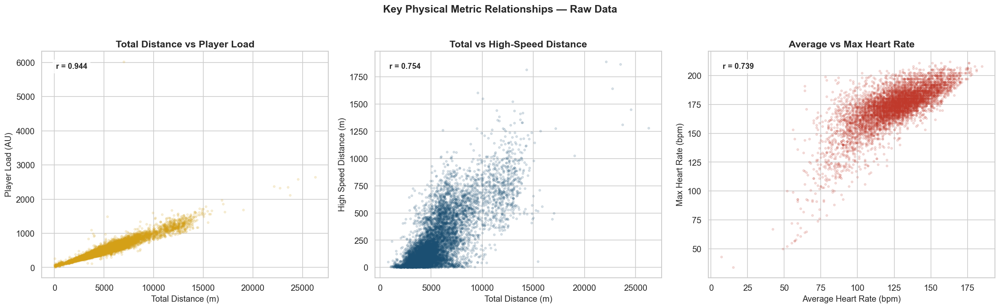

In [35]:
# ── 7.3  Player Load vs Distance scatterplot ────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Total distance vs Player Load
ax = axes[0]
mask = (raw['total_distance'] > 0) & (raw['total_player_load'] > 0)
ax.scatter(raw.loc[mask, 'total_distance'], raw.loc[mask, 'total_player_load'],
           alpha=0.15, s=8, color=OHL_AMBER)
ax.set_xlabel('Total Distance (m)')
ax.set_ylabel('Player Load (AU)')
ax.set_title('Total Distance vs Player Load', fontweight='bold')
# Add correlation
r = raw.loc[mask, ['total_distance', 'total_player_load']].corr().iloc[0, 1]
ax.text(0.05, 0.95, f'r = {r:.3f}', transform=ax.transAxes, fontsize=11,
        fontweight='bold', va='top', bbox=dict(facecolor='white', alpha=0.8))

# HSD vs Total Distance
ax = axes[1]
mask2 = (raw['high_speed_distance'] > 0) & (raw['total_distance'] > 0)
ax.scatter(raw.loc[mask2, 'total_distance'], raw.loc[mask2, 'high_speed_distance'],
           alpha=0.15, s=8, color=OHL_BLUE)
ax.set_xlabel('Total Distance (m)')
ax.set_ylabel('High Speed Distance (m)')
ax.set_title('Total vs High-Speed Distance', fontweight='bold')
r2 = raw.loc[mask2, ['total_distance', 'high_speed_distance']].corr().iloc[0, 1]
ax.text(0.05, 0.95, f'r = {r2:.3f}', transform=ax.transAxes, fontsize=11,
        fontweight='bold', va='top', bbox=dict(facecolor='white', alpha=0.8))

# Max HR vs Avg HR
ax = axes[2]
mask3 = (raw['avg_heartrate'] > 0) & (raw['max_heartrate'] > 0)
ax.scatter(raw.loc[mask3, 'avg_heartrate'], raw.loc[mask3, 'max_heartrate'],
           alpha=0.15, s=8, color=OHL_RED)
ax.set_xlabel('Average Heart Rate (bpm)')
ax.set_ylabel('Max Heart Rate (bpm)')
ax.set_title('Average vs Max Heart Rate', fontweight='bold')
r3 = raw.loc[mask3, ['avg_heartrate', 'max_heartrate']].corr().iloc[0, 1]
ax.text(0.05, 0.95, f'r = {r3:.3f}', transform=ax.transAxes, fontsize=11,
        fontweight='bold', va='top', bbox=dict(facecolor='white', alpha=0.8))

fig.suptitle('Key Physical Metric Relationships — Raw Data',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

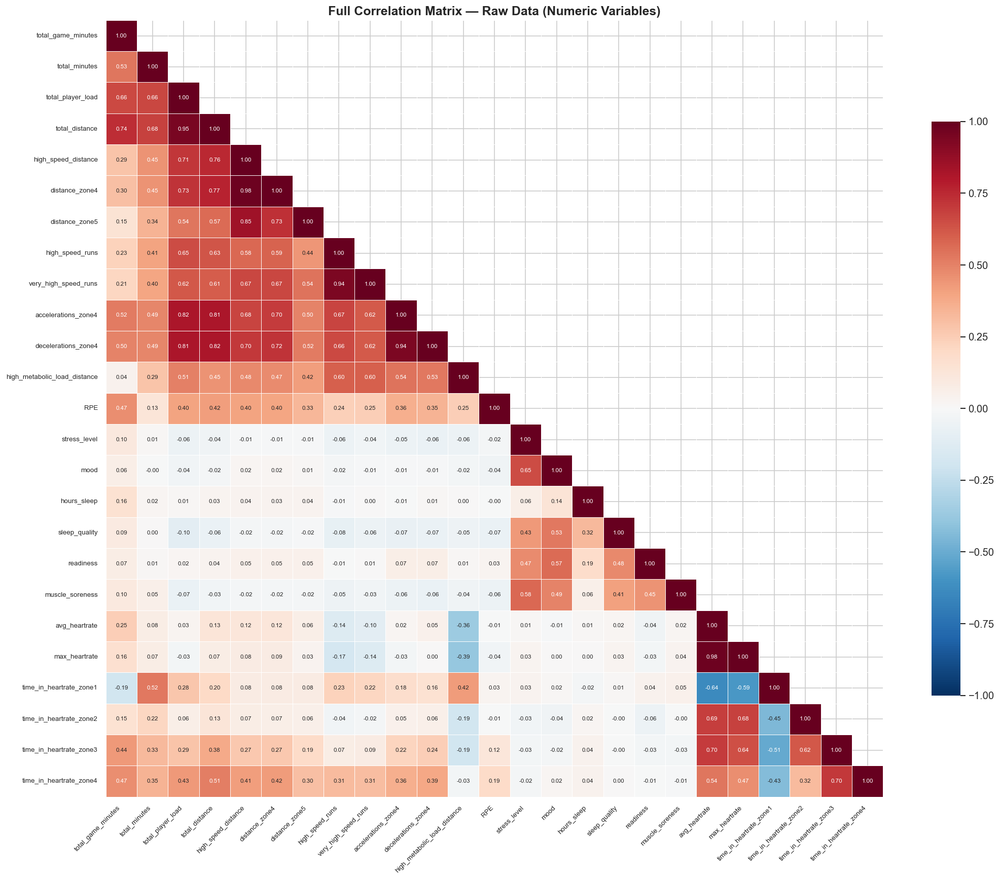

In [36]:
# ── 7.4  Full correlation heatmap of Raw Data numerics ───────────────
numeric_raw = raw.select_dtypes(include='number').drop(columns=['Detail'], errors='ignore')
# Remove columns with all zeros or all same value
numeric_raw = numeric_raw.loc[:, numeric_raw.std() > 0]

fig, ax = plt.subplots(figsize=(18, 15))
corr = numeric_raw.corr()
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            vmin=-1, vmax=1, ax=ax, linewidths=0.3, square=True,
            annot_kws={'fontsize': 7}, cbar_kws={'shrink': 0.7})
ax.set_title('Full Correlation Matrix — Raw Data (Numeric Variables)',
             fontsize=15, fontweight='bold')
plt.xticks(fontsize=8, rotation=45, ha='right')
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

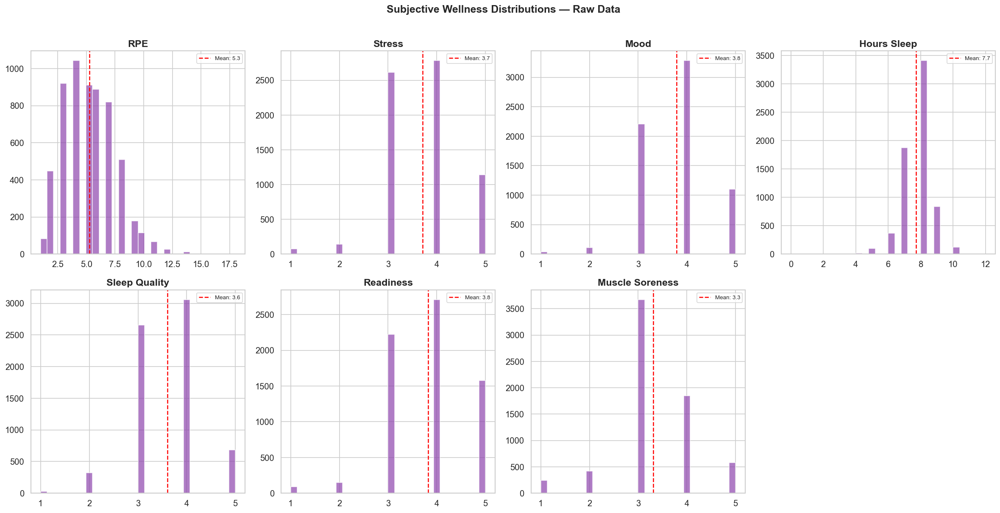

In [37]:
# ── 7.5  Subjective wellness (Raw Data) distributions ────────────────
subj_cols = ['RPE', 'stress_level', 'mood', 'hours_sleep', 'sleep_quality', 'readiness', 'muscle_soreness']
subj_labels = ['RPE', 'Stress', 'Mood', 'Hours Sleep', 'Sleep Quality', 'Readiness', 'Muscle Soreness']

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for ax, col, label in zip(axes.flatten()[:7], subj_cols, subj_labels):
    data = raw[col].dropna()
    if len(data) > 0:
        ax.hist(data, bins=30, alpha=0.7, color=OHL_PURPLE, edgecolor='white')
        ax.axvline(data.mean(), color='red', linestyle='--', label=f'Mean: {data.mean():.1f}')
        ax.set_title(label, fontweight='bold')
        ax.legend(fontsize=8)
axes.flatten()[7].axis('off')

fig.suptitle('Subjective Wellness Distributions — Raw Data',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

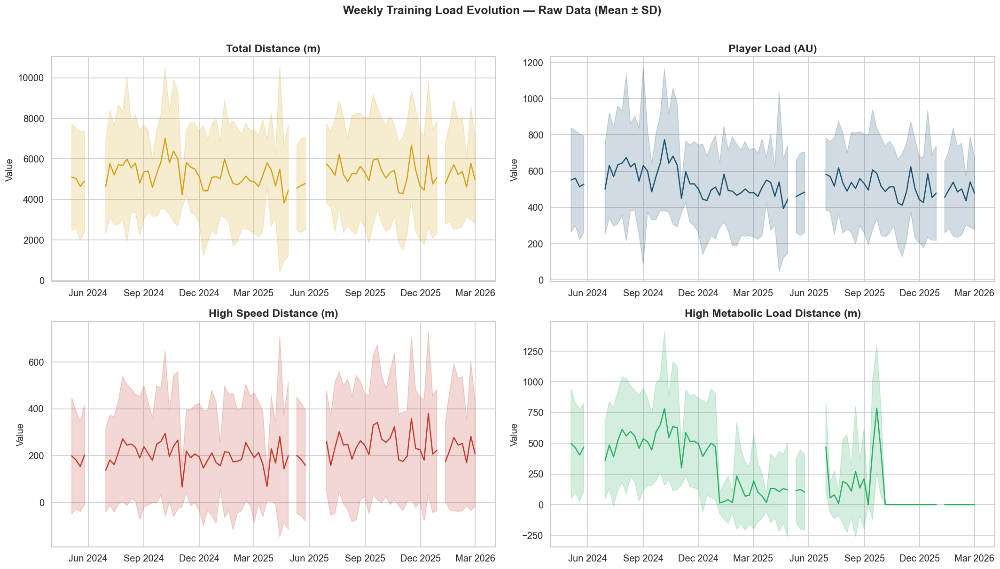

In [38]:
# ── 7.6  Weekly training load evolution (Raw Data) ──────────────────
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

load_metrics = [
    ('total_distance', 'Total Distance (m)', OHL_AMBER),
    ('total_player_load', 'Player Load (AU)', OHL_BLUE),
    ('high_speed_distance', 'High Speed Distance (m)', OHL_RED),
    ('high_metabolic_load_distance', 'High Metabolic Load Distance (m)', OHL_GREEN)
]

for ax, (col, label, color) in zip(axes.flatten(), load_metrics):
    weekly = raw.set_index('Date')[col].resample('W').agg(['mean', 'std'])
    ax.plot(weekly.index, weekly['mean'], color=color, linewidth=1.5)
    ax.fill_between(weekly.index, weekly['mean'] - weekly['std'],
                    weekly['mean'] + weekly['std'], alpha=0.2, color=color)
    ax.set_title(label, fontweight='bold')
    ax.set_ylabel('Value')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))

fig.suptitle('Weekly Training Load Evolution — Raw Data (Mean ± SD)',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

<a id='8'></a>
## 8. Sessions & Games Analysis

Match-day cycles, session types, game performance metrics, and match-week patterns.

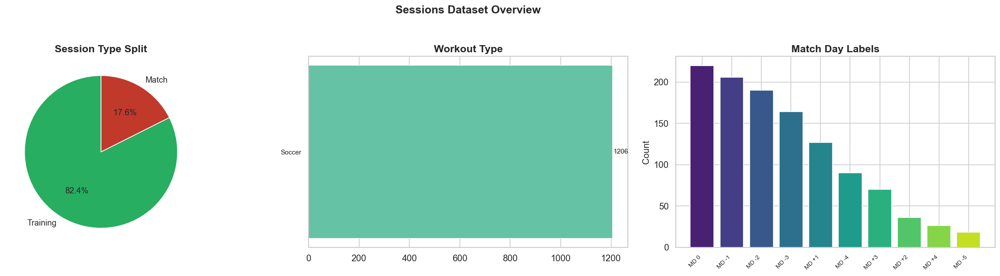

In [39]:
# ── 8.1  Sessions overview ───────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Session type
st_counts = sess['session_type'].value_counts()
axes[0].pie(st_counts.values, labels=st_counts.index, autopct='%1.1f%%',
            colors=[OHL_GREEN, OHL_RED], startangle=90, textprops={'fontsize': 11})
axes[0].set_title('Session Type Split', fontweight='bold')

# Workout type
wt_counts = sess['workout_type'].value_counts().head(8)
axes[1].barh(range(len(wt_counts)), wt_counts.values, color=sns.color_palette('Set2', len(wt_counts)),
             edgecolor='white')
axes[1].set_yticks(range(len(wt_counts)))
axes[1].set_yticklabels(wt_counts.index, fontsize=9)
for i, v in enumerate(wt_counts.values):
    axes[1].text(v + 2, i, str(v), va='center', fontsize=9)
axes[1].set_title('Workout Type', fontweight='bold')
axes[1].invert_yaxis()

# Matchday distribution
md_counts = sess['matchday'].value_counts().head(10)
axes[2].bar(range(len(md_counts)), md_counts.values,
            color=sns.color_palette('viridis', len(md_counts)), edgecolor='white')
axes[2].set_xticks(range(len(md_counts)))
labels = [str(x)[:15] for x in md_counts.index]
axes[2].set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
axes[2].set_title('Match Day Labels', fontweight='bold')
axes[2].set_ylabel('Count')

fig.suptitle('Sessions Dataset Overview', fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

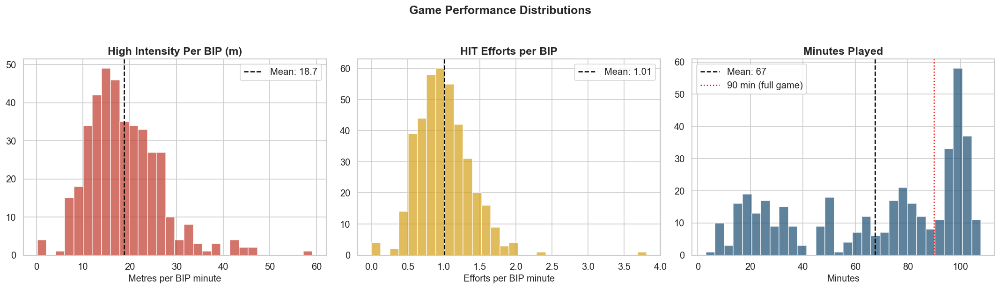

In [40]:
# ── 8.2  Games — Performance distributions ──────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# High Intensity Per BIP
data1 = games['High Intensity Per BIP (m)'].dropna()
axes[0].hist(data1, bins=30, alpha=0.7, color=OHL_RED, edgecolor='white')
axes[0].axvline(data1.mean(), color='black', linestyle='--', label=f'Mean: {data1.mean():.1f}')
axes[0].set_title('High Intensity Per BIP (m)', fontweight='bold')
axes[0].set_xlabel('Metres per BIP minute')
axes[0].legend()

# HIT Efforts per BIP
data2 = games['HIT Efforts per BIP'].dropna()
axes[1].hist(data2, bins=30, alpha=0.7, color=OHL_AMBER, edgecolor='white')
axes[1].axvline(data2.mean(), color='black', linestyle='--', label=f'Mean: {data2.mean():.2f}')
axes[1].set_title('HIT Efforts per BIP', fontweight='bold')
axes[1].set_xlabel('Efforts per BIP minute')
axes[1].legend()

# Minutes played
data3 = games['minutes_played'].dropna()
axes[2].hist(data3, bins=30, alpha=0.7, color=OHL_BLUE, edgecolor='white')
axes[2].axvline(data3.mean(), color='black', linestyle='--', label=f'Mean: {data3.mean():.0f}')
axes[2].axvline(90, color='red', linestyle=':', label='90 min (full game)')
axes[2].set_title('Minutes Played', fontweight='bold')
axes[2].set_xlabel('Minutes')
axes[2].legend()

fig.suptitle('Game Performance Distributions', fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

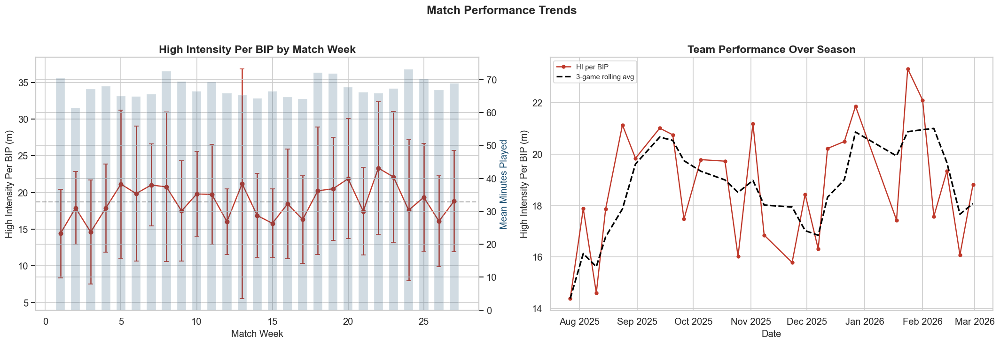

In [41]:
# ── 8.3  Match week performance evolution ────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Performance by match week
mw_perf = games.groupby('match_week').agg({
    'High Intensity Per BIP (m)': ['mean', 'std'],
    'minutes_played': 'mean'
})
mw_perf.columns = ['HI_mean', 'HI_std', 'min_mean']

axes[0].errorbar(mw_perf.index, mw_perf['HI_mean'], yerr=mw_perf['HI_std'],
                 fmt='o-', color=OHL_RED, capsize=3, markersize=5, linewidth=1.5)
axes[0].set_title('High Intensity Per BIP by Match Week', fontweight='bold')
axes[0].set_xlabel('Match Week')
axes[0].set_ylabel('High Intensity Per BIP (m)')
axes[0].axhline(mw_perf['HI_mean'].mean(), color='gray', linestyle='--', alpha=0.5)

# Minutes played by match week
ax2 = axes[0].twinx()
ax2.bar(mw_perf.index, mw_perf['min_mean'], alpha=0.2, color=OHL_BLUE, width=0.6)
ax2.set_ylabel('Mean Minutes Played', color=OHL_BLUE)

# Game-level performance over time
game_dates = games.groupby('Date').agg({
    'High Intensity Per BIP (m)': 'mean',
    'HIT Efforts per BIP': 'mean'
}).sort_index()
axes[1].plot(game_dates.index, game_dates['High Intensity Per BIP (m)'],
             'o-', color=OHL_RED, label='HI per BIP', markersize=4)
axes[1].set_title('Team Performance Over Season', fontweight='bold')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('High Intensity Per BIP (m)')
# Rolling average
if len(game_dates) > 3:
    rolling = game_dates['High Intensity Per BIP (m)'].rolling(3, min_periods=1).mean()
    axes[1].plot(game_dates.index, rolling, '--', color='black', linewidth=2, label='3-game rolling avg')
axes[1].legend(fontsize=9)
axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

fig.suptitle('Match Performance Trends', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

<a id='9'></a>
## 9. Player-Level Profiles

Individual player analysis: observation counts, wellness fingerprints, availability, and training load patterns.

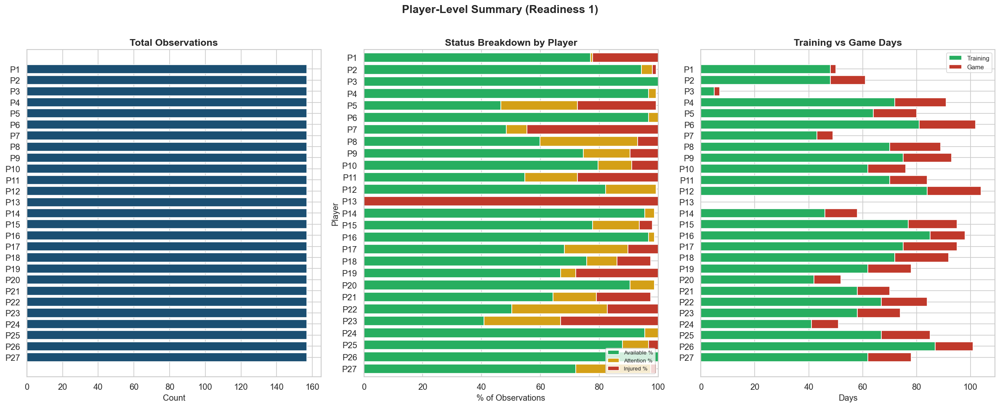

In [42]:
# ── 9.1  Player observation counts & availability ────────────────────
# Build player summary from Readiness 1
player_summary = []
for pk in rd1['Playerkey'].unique():
    p = rd1[rd1['Playerkey'] == pk]
    player_summary.append({
        'Player': pid_map.get(pk, pk[:8]),
        'Position': p['POS'].iloc[0],
        'Observations': len(p),
        'Date Range (days)': (p['Date'].max() - p['Date'].min()).days,
        'Available %': (p['Status'] == 'Available').mean() * 100,
        'Injured %': (p['Status'] == 'Injured').mean() * 100,
        'Attention %': (p['Status'] == 'Attention').mean() * 100,
        'Mean MA%': p['MA%'].mean(),
        'Training Days': (p['Reason'] == 'Training').sum(),
        'Game Days': (p['Reason'] == 'Game').sum(),
    })

psdf = pd.DataFrame(player_summary).sort_values('Observations', ascending=False)

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Observations per player
axes[0].barh(psdf['Player'], psdf['Observations'], color=OHL_BLUE, edgecolor='white')
axes[0].set_title('Total Observations', fontweight='bold')
axes[0].set_xlabel('Count')
axes[0].invert_yaxis()

# Availability breakdown (stacked)
avail_data = psdf[['Player', 'Available %', 'Attention %', 'Injured %']].set_index('Player')
avail_data.plot.barh(stacked=True, ax=axes[1],
                      color=[OHL_GREEN, OHL_AMBER, OHL_RED], edgecolor='white', width=0.8)
axes[1].set_title('Status Breakdown by Player', fontweight='bold')
axes[1].set_xlabel('% of Observations')
axes[1].legend(fontsize=8, loc='lower right')
axes[1].invert_yaxis()

# Training vs Game days
axes[2].barh(psdf['Player'], psdf['Training Days'], color=OHL_GREEN, label='Training', edgecolor='white')
axes[2].barh(psdf['Player'], psdf['Game Days'], left=psdf['Training Days'].values,
             color=OHL_RED, label='Game', edgecolor='white')
axes[2].set_title('Training vs Game Days', fontweight='bold')
axes[2].set_xlabel('Days')
axes[2].legend(fontsize=9)
axes[2].invert_yaxis()

fig.suptitle('Player-Level Summary (Readiness 1)', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

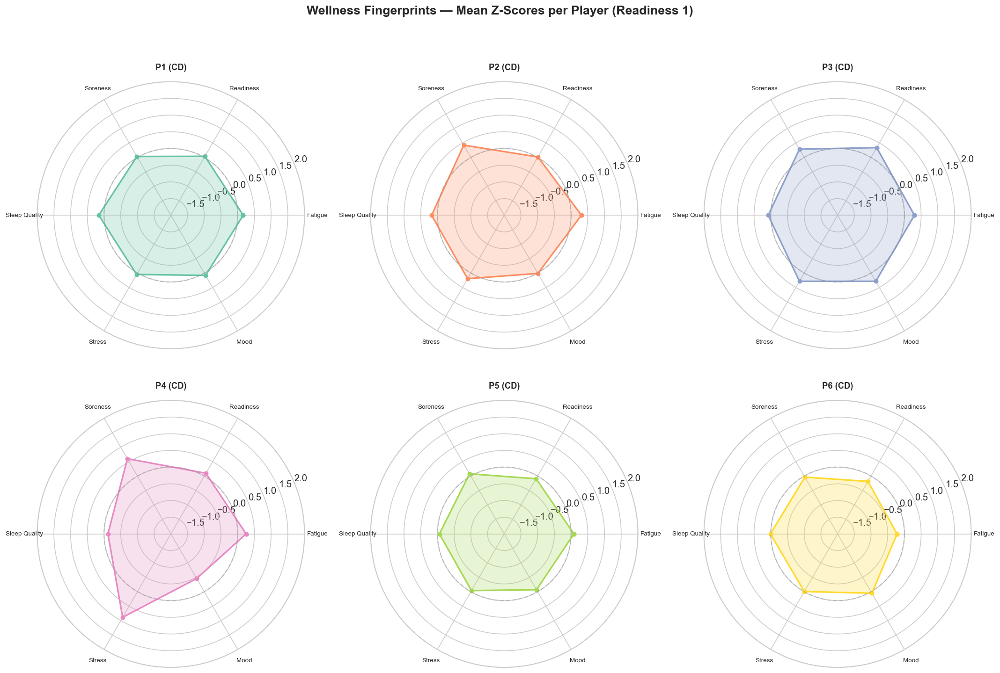

In [43]:
# ── 9.2  Wellness fingerprint radar chart (per player) ───────────────
from math import pi

# Select top-6 most observed players for readability
top_players = psdf.head(6)['Player'].tolist()
top_pks = [pk for pk, pid in pid_map.items() if pid in top_players]

fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw=dict(polar=True))
categories = ['Fatigue (z)', 'Readiness (z)', 'Soreness (z)',
              'Sleep Quality (z)', 'Stress (z)', 'Mood (z)']
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

colors_radar = sns.color_palette('Set2', 6)
for ax, pk, color in zip(axes.flatten(), top_pks, colors_radar):
    p = rd1[rd1['Playerkey'] == pk]
    values = [p[c].mean() for c in categories]
    values += values[:1]

    ax.plot(angles, values, 'o-', linewidth=2, color=color, markersize=5)
    ax.fill(angles, values, alpha=0.25, color=color)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels([c.replace(' (z)', '') for c in categories], fontsize=8)
    pos = p['POS'].iloc[0]
    ax.set_title(f'{pid_map[pk]} ({pos})', fontweight='bold', fontsize=11, pad=15)
    ax.set_ylim(-2, 2)
    ax.axhline(0, color='gray', linestyle='--', alpha=0.3)

fig.suptitle('Wellness Fingerprints \u2014 Mean Z-Scores per Player (Readiness 1)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

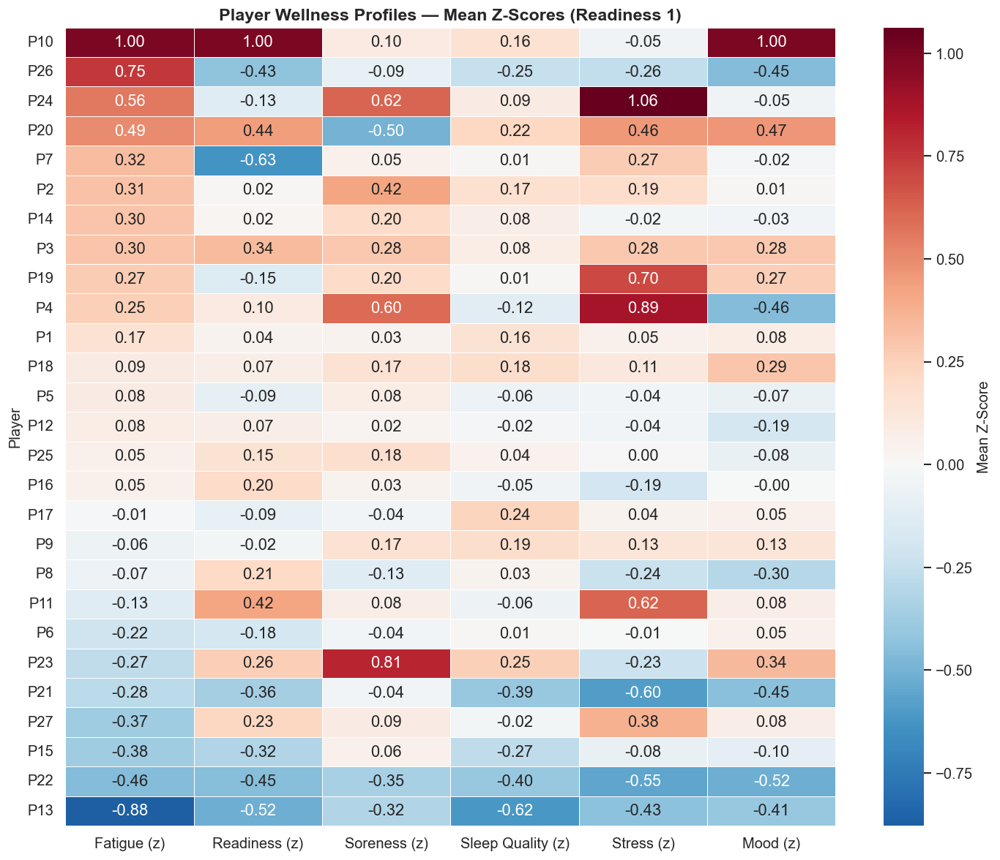

In [44]:
# ── 9.3  Player-level wellness heatmap (mean z-scores) ───────────────
player_wellness = rd1.groupby('Playerkey')[wellness_cols].mean()
player_wellness.index = player_wellness.index.map(pid_map)
player_wellness = player_wellness.sort_values('Fatigue (z)', ascending=False)

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(player_wellness, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            linewidths=0.5, ax=ax, cbar_kws={'label': 'Mean Z-Score'})
ax.set_title('Player Wellness Profiles — Mean Z-Scores (Readiness 1)',
             fontsize=14, fontweight='bold')
ax.set_ylabel('Player')
plt.tight_layout()
plt.show()

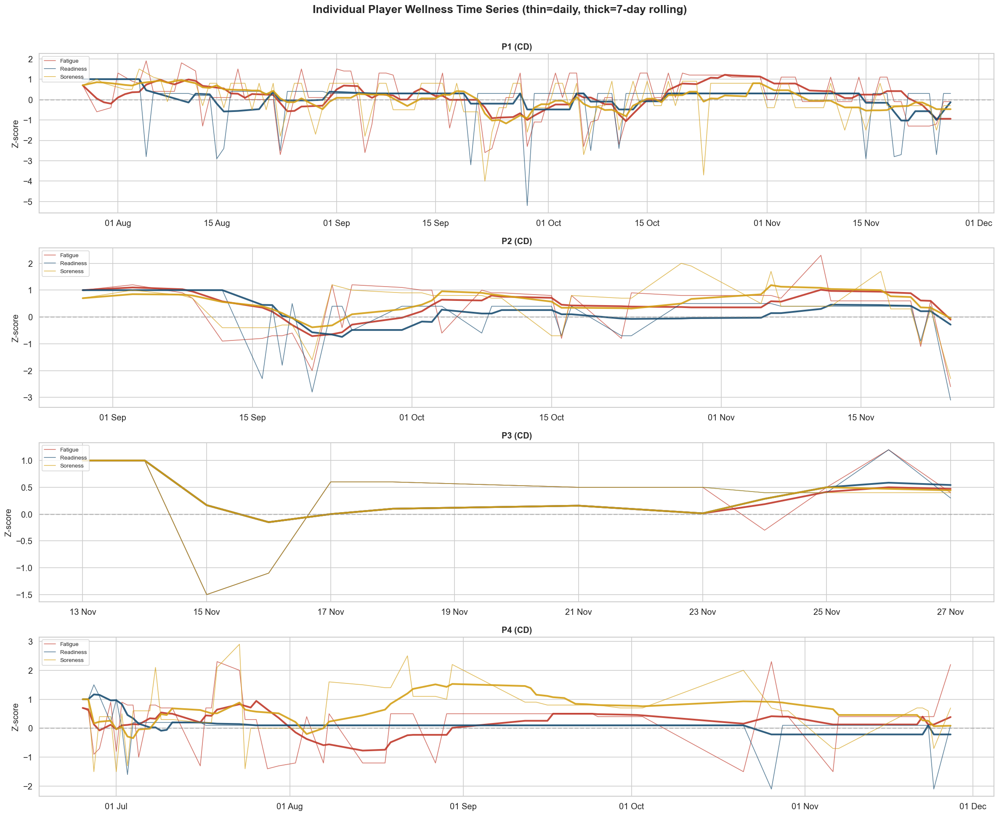

In [45]:
# ── 9.4  Individual player time-series (top 4 players) ───────────────
top4_pks = top_pks[:4]

fig, axes = plt.subplots(4, 1, figsize=(20, 16), sharex=False)
for ax, pk in zip(axes, top4_pks):
    p = rd1[rd1['Playerkey'] == pk].sort_values('Date').set_index('Date')
    for col, color in zip(['Fatigue (z)', 'Readiness (z)', 'Soreness (z)'],
                           [OHL_RED, OHL_BLUE, OHL_AMBER]):
        if col in p.columns:
            vals = p[col].dropna()
            ax.plot(vals.index, vals.values, label=col.replace(' (z)', ''),
                    color=color, alpha=0.7, linewidth=1)
            # 7-day rolling
            roll = vals.rolling(7, min_periods=1).mean()
            ax.plot(roll.index, roll.values, color=color, linewidth=2.5, alpha=0.9)

    ax.axhline(0, color='gray', linestyle='--', alpha=0.4)
    pos = p['POS'].iloc[0] if 'POS' in p.columns else '?'
    ax.set_title(f'{pid_map[pk]} ({pos})',
                 fontweight='bold', fontsize=12)
    ax.set_ylabel('Z-score')
    ax.legend(fontsize=8, loc='upper left')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))

fig.suptitle('Individual Player Wellness Time Series (thin=daily, thick=7-day rolling)',
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

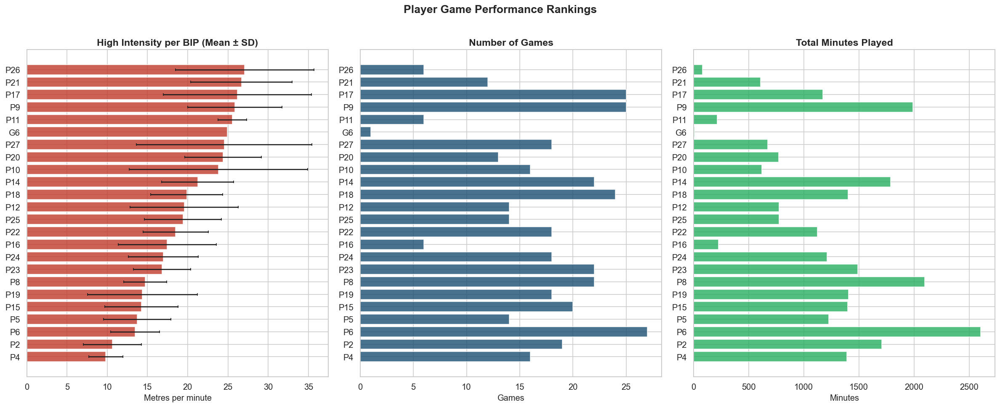

In [46]:
# ── 9.5  Games: Player-level performance ranking ────────────────────
player_game_stats = games.groupby('playerkey').agg({
    'High Intensity Per BIP (m)': ['mean', 'std', 'count'],
    'HIT Efforts per BIP': 'mean',
    'minutes_played': ['mean', 'sum']
}).round(2)
player_game_stats.columns = ['HI_mean', 'HI_std', 'Games', 'HIT_mean', 'Min_mean', 'Min_total']
player_game_stats = player_game_stats.sort_values('HI_mean', ascending=False)

# Map playerkeys to simple IDs if possible
game_pid_map = {}
for i, pk in enumerate(player_game_stats.index):
    if pk in pid_map:
        game_pid_map[pk] = pid_map[pk]
    else:
        game_pid_map[pk] = f'G{i+1}'
player_game_stats.index = player_game_stats.index.map(game_pid_map)

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# HI per BIP ranking
axes[0].barh(player_game_stats.index, player_game_stats['HI_mean'],
             xerr=player_game_stats['HI_std'], color=OHL_RED, edgecolor='white',
             capsize=2, alpha=0.8)
axes[0].set_title('High Intensity per BIP (Mean ± SD)', fontweight='bold')
axes[0].set_xlabel('Metres per minute')
axes[0].invert_yaxis()

# Games played
axes[1].barh(player_game_stats.index, player_game_stats['Games'],
             color=OHL_BLUE, edgecolor='white', alpha=0.8)
axes[1].set_title('Number of Games', fontweight='bold')
axes[1].set_xlabel('Games')
axes[1].invert_yaxis()

# Total minutes
axes[2].barh(player_game_stats.index, player_game_stats['Min_total'],
             color=OHL_GREEN, edgecolor='white', alpha=0.8)
axes[2].set_title('Total Minutes Played', fontweight='bold')
axes[2].set_xlabel('Minutes')
axes[2].invert_yaxis()

fig.suptitle('Player Game Performance Rankings', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

<a id='10'></a>
## 10. Cross-Dataset Insights & Correlations

Merging datasets to find relationships between training load, wellness, and match performance.

Merged rows: 1,973 (from 4,239 readiness + 9,968 raw)


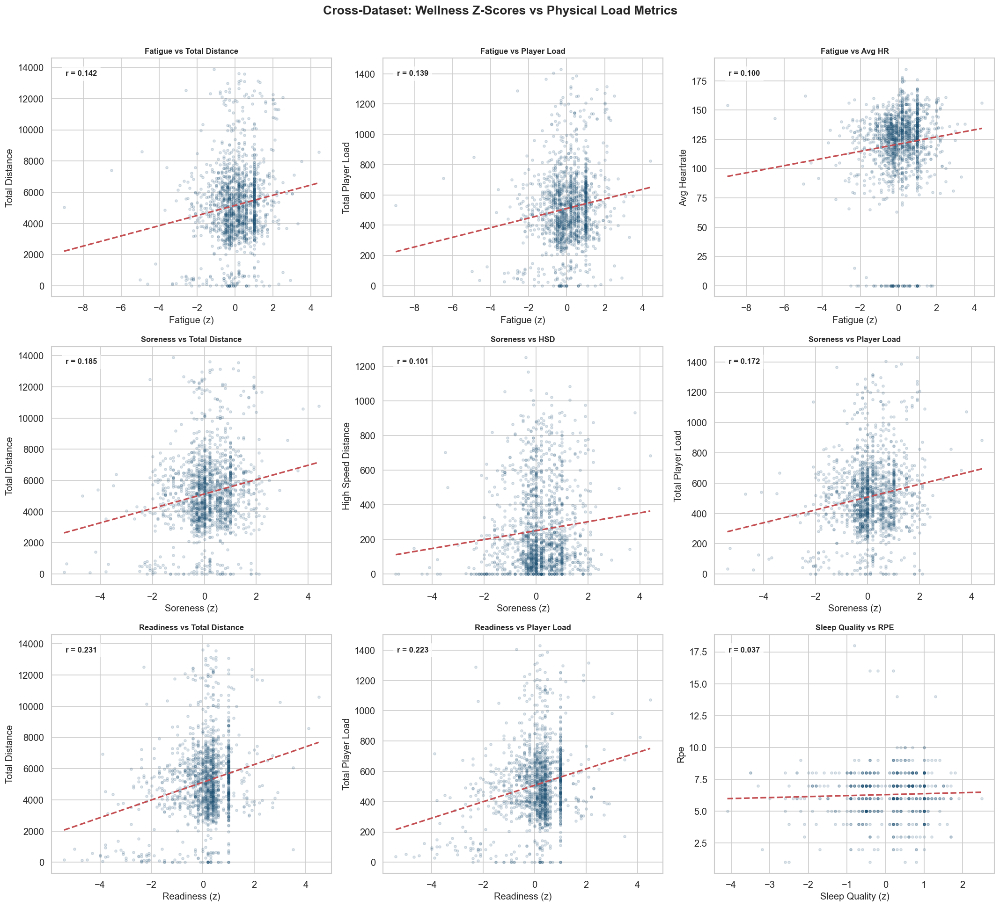

In [47]:
# ── 10.1  Merge Readiness 1 with Raw Data ────────────────────────────
# Merge on Date + Playerkey to get both wellness z-scores and GPS metrics
merged = rd1.merge(
    raw[['Date', 'playerkey', 'total_distance', 'high_speed_distance',
         'total_player_load', 'avg_heartrate', 'max_heartrate',
         'total_minutes', 'RPE']],
    left_on=['Date', 'Playerkey'],
    right_on=['Date', 'playerkey'],
    how='inner'
)
print(f'Merged rows: {len(merged):,} (from {len(rd1):,} readiness + {len(raw):,} raw)')

# ── Wellness vs GPS load scatter matrix ─────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(18, 16))
pairs = [
    ('Fatigue (z)', 'total_distance', 'Fatigue vs Total Distance'),
    ('Fatigue (z)', 'total_player_load', 'Fatigue vs Player Load'),
    ('Fatigue (z)', 'avg_heartrate', 'Fatigue vs Avg HR'),
    ('Soreness (z)', 'total_distance', 'Soreness vs Total Distance'),
    ('Soreness (z)', 'high_speed_distance', 'Soreness vs HSD'),
    ('Soreness (z)', 'total_player_load', 'Soreness vs Player Load'),
    ('Readiness (z)', 'total_distance', 'Readiness vs Total Distance'),
    ('Readiness (z)', 'total_player_load', 'Readiness vs Player Load'),
    ('Sleep Quality (z)', 'RPE', 'Sleep Quality vs RPE'),
]

for ax, (x, y, title) in zip(axes.flatten(), pairs):
    data = merged[[x, y]].dropna()
    if len(data) > 10:
        ax.scatter(data[x], data[y], alpha=0.15, s=10, color=OHL_BLUE)
        # Add trend line
        z = np.polyfit(data[x], data[y], 1)
        p = np.poly1d(z)
        x_line = np.linspace(data[x].min(), data[x].max(), 100)
        ax.plot(x_line, p(x_line), 'r--', linewidth=2)
        r = data[x].corr(data[y])
        ax.text(0.05, 0.95, f'r = {r:.3f}', transform=ax.transAxes,
                fontsize=10, fontweight='bold', va='top',
                bbox=dict(facecolor='white', alpha=0.8))
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.set_xlabel(x)
    ax.set_ylabel(y.replace('_', ' ').title())

fig.suptitle('Cross-Dataset: Wellness Z-Scores vs Physical Load Metrics',
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

Matched game-readiness pairs: 235


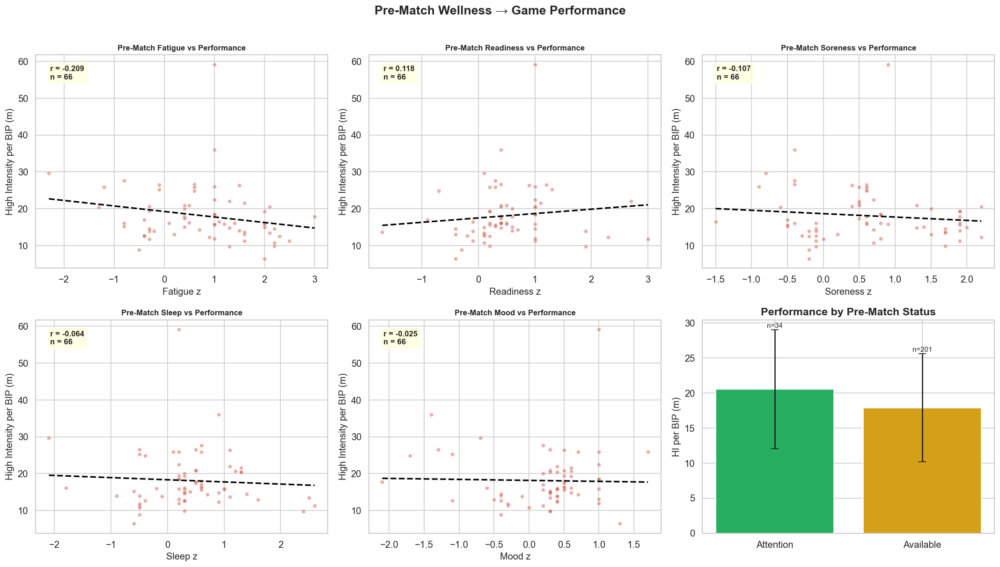

In [48]:
# ── 10.2  Readiness + Games: Does pre-match wellness predict performance? ──
# For each game row, get the most recent readiness data from the same player
game_readiness = []
for _, g_row in games.iterrows():
    pk = g_row['playerkey']
    g_date = g_row['Date']
    # Find readiness data for this player within 3 days before match
    mask = (rd1['Playerkey'] == pk) & (rd1['Date'] >= g_date - pd.Timedelta(days=3)) & (rd1['Date'] <= g_date)
    pre_match = rd1[mask]
    if len(pre_match) > 0:
        last = pre_match.sort_values('Date').iloc[-1]
        game_readiness.append({
            'playerkey': pk,
            'Date': g_date,
            'HI_per_BIP': g_row['High Intensity Per BIP (m)'],
            'HIT_per_BIP': g_row['HIT Efforts per BIP'],
            'minutes_played': g_row['minutes_played'],
            'Fatigue_z': last['Fatigue (z)'],
            'Readiness_z': last['Readiness (z)'],
            'Soreness_z': last['Soreness (z)'],
            'Sleep_z': last['Sleep Quality (z)'],
            'Mood_z': last['Mood (z)'],
            'Status': last['Status'],
        })

gr_df = pd.DataFrame(game_readiness)
print(f'Matched game-readiness pairs: {len(gr_df)}')

if len(gr_df) > 10:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    wellness_game_pairs = [
        ('Fatigue_z', 'HI_per_BIP', 'Pre-Match Fatigue vs Performance'),
        ('Readiness_z', 'HI_per_BIP', 'Pre-Match Readiness vs Performance'),
        ('Soreness_z', 'HI_per_BIP', 'Pre-Match Soreness vs Performance'),
        ('Sleep_z', 'HI_per_BIP', 'Pre-Match Sleep vs Performance'),
        ('Mood_z', 'HI_per_BIP', 'Pre-Match Mood vs Performance'),
    ]
    for ax, (x, y, title) in zip(axes.flatten()[:5], wellness_game_pairs):
        data = gr_df[[x, y]].dropna()
        if len(data) > 5:
            ax.scatter(data[x], data[y], alpha=0.4, s=25, color=OHL_RED, edgecolors='white')
            z = np.polyfit(data[x], data[y], 1)
            p_fit = np.poly1d(z)
            x_line = np.linspace(data[x].min(), data[x].max(), 100)
            ax.plot(x_line, p_fit(x_line), '--', color='black', linewidth=2)
            r = data[x].corr(data[y])
            ax.text(0.05, 0.95, f'r = {r:.3f}\nn = {len(data)}', transform=ax.transAxes,
                    fontsize=10, fontweight='bold', va='top',
                    bbox=dict(facecolor='lightyellow', alpha=0.9))
        ax.set_title(title, fontweight='bold', fontsize=10)
        ax.set_xlabel(x.replace('_', ' '))
        ax.set_ylabel('High Intensity per BIP (m)')

    # Performance by pre-match status
    if 'Status' in gr_df.columns:
        status_perf = gr_df.groupby('Status')['HI_per_BIP'].agg(['mean', 'std', 'count'])
        status_perf = status_perf[status_perf['count'] >= 3]
        if len(status_perf) > 0:
            axes[1, 2].bar(status_perf.index, status_perf['mean'],
                          yerr=status_perf['std'], color=[OHL_GREEN, OHL_AMBER, OHL_RED][:len(status_perf)],
                          edgecolor='white', capsize=5)
            axes[1, 2].set_title('Performance by Pre-Match Status', fontweight='bold')
            axes[1, 2].set_ylabel('HI per BIP (m)')
            for i, (idx, row) in enumerate(status_perf.iterrows()):
                cnt = int(row['count'])
                axes[1, 2].text(i, row['mean'] + row['std'] + 0.3, f'n={cnt}',
                               ha='center', fontsize=9)
        else:
            axes[1, 2].text(0.5, 0.5, 'Insufficient data', ha='center', va='center',
                           transform=axes[1, 2].transAxes)

    fig.suptitle('Pre-Match Wellness \u2192 Game Performance',
                 fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

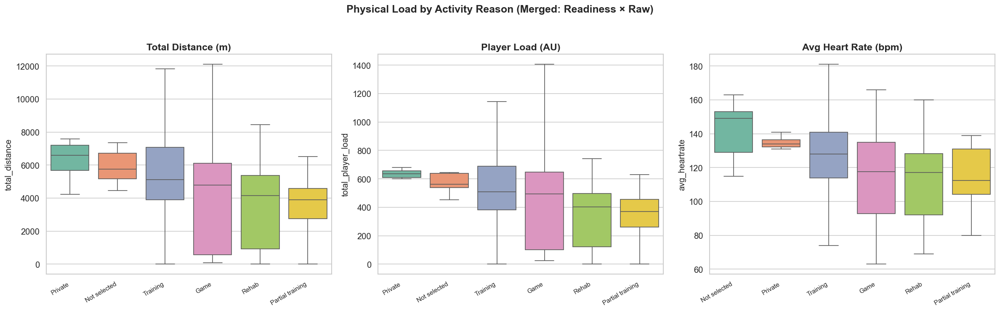

In [49]:
# ── 10.3  Training load by Activity Reason (merged) ──────────────────
if len(merged) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    for ax, (col, label) in zip(axes, [
        ('total_distance', 'Total Distance (m)'),
        ('total_player_load', 'Player Load (AU)'),
        ('avg_heartrate', 'Avg Heart Rate (bpm)')
    ]):
        reason_data = merged[['Reason', col]].dropna()
        top_reasons = reason_data['Reason'].value_counts().head(6).index
        reason_data = reason_data[reason_data['Reason'].isin(top_reasons)]
        order = reason_data.groupby('Reason')[col].median().sort_values(ascending=False).index
        sns.boxplot(data=reason_data, x='Reason', y=col, order=order, ax=ax,
                    palette='Set2', showfliers=False)
        ax.set_title(label, fontweight='bold')
        ax.set_xlabel('')
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=30, ha='right', fontsize=9)

    fig.suptitle('Physical Load by Activity Reason (Merged: Readiness × Raw)',
                 fontsize=15, fontweight='bold', y=1.03)
    plt.tight_layout()
    plt.show()

In [50]:
# ── 10.4  Grand summary statistics table ─────────────────────────────
print('=' * 80)
print('COMPREHENSIVE DATA EXPLORATION \u2014 SUMMARY')
print('=' * 80)
print()
print(f'Total datasets explored:       5')
print(f'Total rows across datasets:    {sum(df.shape[0] for df in datasets.values()):,}')
print(f'Total columns across datasets: {sum(df.shape[1] for df in datasets.values())}')
print(f'Unique players (Readiness):    {len(pk_readiness)}')
print(f'Unique players (Raw Data):     {len(pk_raw)}')
print(f'Unique players (Games):        {len(pk_games)}')
print(f'Players in ALL datasets:       {len(pk_readiness & pk_raw & pk_games)}')
date_min = min(df['Date'].min() for df in datasets.values())
date_max = max(df['Date'].max() for df in datasets.values())
print(f'Date range (earliest):         {date_min.strftime("%d %b %Y")}')
print(f'Date range (latest):           {date_max.strftime("%d %b %Y")}')
print(f'Cross-dataset merged rows:     {len(merged):,}')
print(f'Game-readiness matched pairs:  {len(gr_df)}')
print()
print('Key Findings:')
print('  \u2022 Readiness 1 is a subset of Readiness 2 (149 overlapping dates)')
print('  \u2022 Raw Data covers 84 players vs 27 in Readiness (broader squad)')
print('  \u2022 Wellness z-scores missing ~48% in Readiness 1 (non-assessment days)')
print('  \u2022 RPE missing ~82% in Readiness 1 (only recorded after sessions)')
avail_pct = (rd1['Status'] == 'Available').mean() * 100
inj_pct = (rd1['Status'] == 'Injured').mean() * 100
att_pct = (rd1['Status'] == 'Attention').mean() * 100
print(f'  \u2022 Status distribution: ~{avail_pct:.0f}% Available, '
      f'~{inj_pct:.0f}% Injured, '
      f'~{att_pct:.0f}% Attention')
print()
print('Visualisations generated: 35+ plots across 10 sections \u2713')

COMPREHENSIVE DATA EXPLORATION — SUMMARY

Total datasets explored:       5
Total rows across datasets:    22,597
Total columns across datasets: 105
Unique players (Readiness):    28
Unique players (Raw Data):     84
Unique players (Games):        25
Players in ALL datasets:       23
Date range (earliest):         02 May 2024
Date range (latest):           01 Mar 2026
Cross-dataset merged rows:     1,973
Game-readiness matched pairs:  235

Key Findings:
  • Readiness 1 is a subset of Readiness 2 (149 overlapping dates)
  • Raw Data covers 84 players vs 27 in Readiness (broader squad)
  • Wellness z-scores missing ~48% in Readiness 1 (non-assessment days)
  • RPE missing ~82% in Readiness 1 (only recorded after sessions)
  • Status distribution: ~74% Available, ~14% Injured, ~12% Attention

Visualisations generated: 35+ plots across 10 sections ✓


<a id='11'></a>
## 11. Text Output
> **Purpose:** One giant printout summarising all datasets, their interlinkages, variable descriptions, distributions, missingness, and key insights. Designed to be copy-pasted into an LLM for full context.

In [51]:
# ── 11.1  Comprehensive Text Summary for LLM Context ─────────────────
# This cell prints an extensive text summary of ALL datasets, variables,
# distributions, interlinkages, and key insights.

lines = []
def out(s=''):
    lines.append(s)

def _to_num(df_or_series):
    """Convert all columns to numeric (handles European ',' decimals)."""
    if isinstance(df_or_series, pd.DataFrame):
        return df_or_series.apply(lambda c: pd.to_numeric(
            c.astype(str).str.replace(',', '.', regex=False), errors='coerce'))
    else:
        return pd.to_numeric(
            df_or_series.astype(str).str.replace(',', '.', regex=False), errors='coerce')


out('=' * 100)
out('COMPREHENSIVE DATA SUMMARY \u2014 OH LEUVEN PLAYER MONITORING SYSTEM')
out('Generated from raw_data_visualisation.ipynb')
out('=' * 100)
out()

# \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
# SECTION A: DATASET INVENTORY
# \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
out('-' * 100)
out('A. DATASET INVENTORY')
out('-' * 100)
out()
for k in ['rd1', 'rd2', 'raw', 'sess', 'games']:
    df = datasets[k]
    pk_col = 'Playerkey' if 'Playerkey' in df.columns else 'playerkey'
    n_players = df[pk_col].nunique() if pk_col in df.columns else 'N/A'
    d_min = df['Date'].min().strftime('%d %b %Y')
    d_max = df['Date'].max().strftime('%d %b %Y')
    n_days = (df['Date'].max() - df['Date'].min()).days
    gran_map = {'rd1': 'Daily (player-day)', 'rd2': 'Daily (player-day)',
                'raw': 'Session-level (player-session)', 'sess': 'Session-level (team-session)',
                'games': 'Match-level (player-match)'}
    out(f'  {DS_NAMES[k].upper()}')
    out(f'    Shape:           {df.shape[0]:,} rows x {df.shape[1]} columns')
    out(f'    Players:         {n_players}')
    out(f'    Date range:      {d_min} to {d_max} ({n_days} days)')
    out(f'    Granularity:     {gran_map[k]}')
    col_list = ', '.join(df.columns.tolist())
    out(f'    Columns:         {col_list}')
    dtype_counts = dict(df.dtypes.value_counts())
    out(f'    Dtypes:          {dtype_counts}')
    miss = df.isnull().mean().mean() * 100
    out(f'    Overall missing: {miss:.1f}%')
    out()

# SECTION B: COLUMN-LEVEL DETAIL
out('-' * 100)
out('B. COLUMN-LEVEL DETAIL PER DATASET')
out('-' * 100)
out()
for k in ['rd1', 'rd2', 'raw', 'sess', 'games']:
    df = datasets[k]
    out(f'  {DS_NAMES[k].upper()} \u2014 Column Details:')
    for col in df.columns:
        miss_pct = df[col].isnull().mean() * 100
        dtype = str(df[col].dtype)
        n_unique = df[col].nunique()
        if pd.api.types.is_numeric_dtype(df[col]):
            desc = _to_num(df[col]).describe() if df[col].dtype == 'object' else df[col].describe()
            v_min = desc['min']
            v_mean = desc['mean']
            v_med = desc['50%']
            v_max = desc['max']
            v_std = desc['std']
            out(f'    {col:40s}  dtype={dtype:10s}  missing={miss_pct:5.1f}%  '
                f'min={v_min:.2f}  mean={v_mean:.2f}  '
                f'median={v_med:.2f}  max={v_max:.2f}  std={v_std:.2f}')
        elif df[col].dtype == 'object':
            top_vals = df[col].value_counts().head(5)
            top_str = ', '.join(f'{v}({c})' for v, c in top_vals.items())
            out(f'    {col:40s}  dtype={dtype:10s}  missing={miss_pct:5.1f}%  '
                f'unique={n_unique}  top: {top_str}')
        else:
            out(f'    {col:40s}  dtype={dtype:10s}  missing={miss_pct:5.1f}%  unique={n_unique}')
    out()

# SECTION C: PLAYER OVERLAP & LINKAGE
out('-' * 100)
out('C. PLAYER OVERLAP & LINKAGE ACROSS DATASETS')
out('-' * 100)
out()
pk_rd2 = set(rd2['Playerkey'].unique())
out(f'  Readiness 1 players:         {len(pk_readiness)}')
out(f'  Readiness 2 players:         {len(pk_rd2)}')
out(f'  Raw Data players:            {len(pk_raw)}')
out(f'  Games players:               {len(pk_games)}')
out(f'  RD1 \u2229 RD2:                   {len(pk_readiness & pk_rd2)} shared')
out(f'  RD1 \u2229 Raw:                   {len(pk_readiness & pk_raw)} shared')
out(f'  RD1 \u2229 Games:                 {len(pk_readiness & pk_games)} shared')
out(f'  Raw \u2229 Games:                 {len(pk_raw & pk_games)} shared')
out(f'  All 4 datasets:              {len(pk_readiness & pk_rd2 & pk_raw & pk_games)} shared')
out()

# Date overlap
rd1_dates = set(rd1['Date'].dt.date.unique())
rd2_dates = set(rd2['Date'].dt.date.unique())
rd1_dmin = rd1['Date'].min().strftime('%d %b %Y')
rd1_dmax = rd1['Date'].max().strftime('%d %b %Y')
rd2_dmin = rd2['Date'].min().strftime('%d %b %Y')
rd2_dmax = rd2['Date'].max().strftime('%d %b %Y')
out(f'  RD1 date range:              {rd1_dmin} to {rd1_dmax}')
out(f'  RD2 date range:              {rd2_dmin} to {rd2_dmax}')
out(f'  RD1 \u2229 RD2 overlapping dates: {len(rd1_dates & rd2_dates)} dates')
out(f'  RD1 unique dates:            {len(rd1_dates - rd2_dates)} dates')
out(f'  RD2 unique dates:            {len(rd2_dates - rd1_dates)} dates')
out()

# Merge coverage
out('  Merge coverage (Date x Playerkey):')
merge_pairs = [
    ('rd1', 'raw', 'Playerkey', 'playerkey'),
    ('rd1', 'games', 'Playerkey', 'playerkey'),
    ('raw', 'games', 'playerkey', 'playerkey'),
]
for ds_a, ds_b, pk_a, pk_b in merge_pairs:
    df_a, df_b = datasets[ds_a], datasets[ds_b]
    merged_ab = pd.merge(
        df_a[['Date', pk_a]].rename(columns={pk_a: 'pk'}),
        df_b[['Date', pk_b]].rename(columns={pk_b: 'pk'}),
        on=['Date', 'pk'], how='inner'
    )
    pct_a = len(merged_ab) / len(df_a) * 100 if len(df_a) > 0 else 0
    pct_b = len(merged_ab) / len(df_b) * 100 if len(df_b) > 0 else 0
    out(f'    {DS_NAMES[ds_a]:15s} x {DS_NAMES[ds_b]:15s}: {len(merged_ab):>6,} matched rows  '
        f'({pct_a:.1f}% of {DS_NAMES[ds_a]}, {pct_b:.1f}% of {DS_NAMES[ds_b]})')
out()

# SECTION D: TEMPORAL PATTERNS
out('-' * 100)
out('D. TEMPORAL PATTERNS')
out('-' * 100)
out()
for k in ['rd1', 'rd2', 'raw', 'sess', 'games']:
    df = datasets[k]
    daily = df.groupby(df['Date'].dt.date).size()
    dow = df['Date'].dt.day_name().value_counts()
    out(f'  {DS_NAMES[k].upper()}:')
    out(f'    Daily obs:  min={daily.min()}, mean={daily.mean():.1f}, max={daily.max()}')
    dow_str = ', '.join(f'{d}: {c}' for d, c in dow.head(7).items())
    out(f'    Day-of-week distribution: {dow_str}')
    out()

# SECTION E: READINESS DATA DEEP DIVE
out('-' * 100)
out('E. READINESS DATA 1 \u2014 DEEP DIVE')
out('-' * 100)
out()

wellness_cols = ['Fatigue (z)', 'Readiness (z)', 'Soreness (z)',
                 'Sleep Quality (z)', 'Stress (z)', 'Mood (z)']
out('  Wellness Z-Score Summary (28-day rolling, per-player baseline):')
for col in wellness_cols:
    if col in rd1.columns:
        s = rd1[col].dropna()
        out(f'    {col:25s}  n={len(s):>4,}  mean={s.mean():+.3f}  std={s.std():.3f}  '
            f'min={s.min():.2f}  max={s.max():.2f}  skew={s.skew():.2f}')
out()

acwr_cols = [c for c in rd1.columns if 'ACWR' in c and c != 'Any ACWR Danger']
out('  ACWR (Acute:Chronic Workload Ratio) Summary:')
for col in acwr_cols:
    if col in rd1.columns:
        s = rd1[col].dropna()
        in_sweet = ((s >= 0.8) & (s <= 1.3)).mean() * 100
        danger = (s > 1.5).mean() * 100
        out(f'    {col:45s}  n={len(s):>4,}  mean={s.mean():.3f}  std={s.std():.3f}  '
            f'sweet_spot(0.8-1.3)={in_sweet:.1f}%  danger(>1.5)={danger:.1f}%')
out()

out('  Medical Status Distribution:')
status_counts = rd1['Status'].value_counts()
for status, count in status_counts.items():
    out(f'    {status:20s}  {count:>5,} ({count/len(rd1)*100:.1f}%)')
out()

if 'Reason' in rd1.columns:
    out('  Activity Reason Distribution:')
    reason_counts = rd1['Reason'].value_counts()
    for reason, count in reason_counts.items():
        out(f'    {str(reason):30s}  {count:>5,} ({count/len(rd1)*100:.1f}%)')
    out()

gps_pct_cols = [c for c in rd1.columns if '%' in c and 'MA' not in c and 'Att' not in c]
if gps_pct_cols:
    out('  GPS Benchmark Percentages (% of personal match max):')
    for col in gps_pct_cols:
        s = pd.to_numeric(rd1[col], errors='coerce').dropna()
        if len(s) > 0:
            out(f'    {col:30s}  n={len(s):>4,}  mean={s.mean():.1f}%  '
                f'std={s.std():.1f}  min={s.min():.0f}%  max={s.max():.0f}%')
    out()

out('  Position Distribution:')
pos_counts = rd1['POS'].value_counts()
for pos, count in pos_counts.items():
    out(f'    {pos:20s}  {count:>5,} ({count/len(rd1)*100:.1f}%)')
out()

# SECTION F: RAW DATA DEEP DIVE
out('-' * 100)
out('F. RAW DATA \u2014 DEEP DIVE')
out('-' * 100)
out()

gps_cols = ['total_distance', 'high_speed_distance', 'total_player_load',
            'high_metabolic_load_distance', 'max_speed']
out('  GPS External Load Metrics:')
for col in gps_cols:
    if col in raw.columns:
        s = pd.to_numeric(raw[col], errors='coerce').dropna()
        if len(s) > 0:
            out(f'    {col:35s}  n={len(s):>5,}  mean={s.mean():.1f}  std={s.std():.1f}  '
                f'min={s.min():.1f}  median={s.median():.1f}  max={s.max():.1f}')
out()

hr_cols = [c for c in raw.columns if 'heartrate_zone' in c]
if hr_cols:
    out('  Heart Rate Zone Time Distribution (minutes):')
    for col in hr_cols:
        s = pd.to_numeric(raw[col], errors='coerce').dropna()
        if len(s) > 0:
            out(f'    {col:35s}  mean={s.mean():.1f}  std={s.std():.1f}  max={s.max():.1f}')
    out()

subj_cols = ['RPE', 'stress_level', 'mood', 'hours_sleep', 'sleep_quality', 'readiness', 'muscle_soreness']
out('  Subjective Wellness (Raw Scores, not z-scored):')
for col in subj_cols:
    if col in raw.columns:
        s = pd.to_numeric(raw[col], errors='coerce').dropna()
        if len(s) > 0:
            out(f'    {col:25s}  n={len(s):>5,}  mean={s.mean():.2f}  std={s.std():.2f}  '
                f'min={s.min():.0f}  max={s.max():.0f}')
out()

if 'Reason' in raw.columns:
    out('  Session Reason Distribution (Raw Data):')
    rc = raw['Reason'].value_counts()
    for reason, count in rc.items():
        out(f'    {str(reason):30s}  {count:>5,} ({count/len(raw)*100:.1f}%)')
    out()

# SECTION G: SESSIONS DATA
out('-' * 100)
out('G. SESSIONS DATA')
out('-' * 100)
out()
out(f'  Total sessions: {len(sess):,}')
if 'matchday' in sess.columns:
    md_col = sess['matchday']
    if pd.api.types.is_numeric_dtype(md_col):
        matchday_sum = int(md_col.sum())
        matchday_pct = md_col.mean() * 100
        out(f'  Match days:     {matchday_sum} ({matchday_pct:.1f}%)')
    else:
        md_counts = md_col.value_counts()
        out(f'  Matchday values: {md_col.nunique()} unique')
        for val, cnt in md_counts.head(10).items():
            out(f'    {str(val):20s}  {cnt:>5,} ({cnt/len(sess)*100:.1f}%)')
if 'session_type' in sess.columns:
    out('  Session Type Distribution:')
    st_counts = sess['session_type'].value_counts()
    for st, count in st_counts.items():
        out(f'    {str(st):30s}  {count:>5,} ({count/len(sess)*100:.1f}%)')
if 'workout_type' in sess.columns:
    out('  Workout Type Distribution:')
    wt_counts = sess['workout_type'].value_counts()
    for wt, count in wt_counts.items():
        out(f'    {str(wt):30s}  {count:>5,} ({count/len(sess)*100:.1f}%)')
out()

# SECTION H: GAMES DATA
out('-' * 100)
out('H. GAMES DATA')
out('-' * 100)
out()
out(f'  Total game entries: {len(games):,}')
n_game_players = games['playerkey'].nunique()
n_game_dates = games['Date'].nunique()
out(f'  Unique players:     {n_game_players}')
out(f'  Unique match dates: {n_game_dates}')
if 'minutes_played' in games.columns:
    mp = pd.to_numeric(games['minutes_played'], errors='coerce').dropna()
    out(f'  Minutes played:     mean={mp.mean():.1f}  std={mp.std():.1f}  min={mp.min():.0f}  max={mp.max():.0f}')
if 'High Intensity Per BIP (m)' in games.columns:
    hi = pd.to_numeric(games['High Intensity Per BIP (m)'], errors='coerce').dropna()
    out(f'  HI per BIP (m):     mean={hi.mean():.2f}  std={hi.std():.2f}  min={hi.min():.2f}  max={hi.max():.2f}')
if 'HIT Efforts per BIP' in games.columns:
    hit = pd.to_numeric(games['HIT Efforts per BIP'], errors='coerce').dropna()
    out(f'  HIT per BIP:        mean={hit.mean():.2f}  std={hit.std():.2f}  min={hit.min():.2f}  max={hit.max():.2f}')
if 'match_week' in games.columns:
    mw_min = games['match_week'].min()
    mw_max = games['match_week'].max()
    out(f'  Match weeks:        {mw_min} to {mw_max}')
out()

# SECTION I: MISSINGNESS ANALYSIS
out('-' * 100)
out('I. MISSINGNESS ANALYSIS')
out('-' * 100)
out()
for k in ['rd1', 'rd2', 'raw', 'sess', 'games']:
    df = datasets[k]
    miss = df.isnull().mean() * 100
    miss_cols = miss[miss > 0].sort_values(ascending=False)
    out(f'  {DS_NAMES[k].upper()} \u2014 Missing Values:')
    if len(miss_cols) == 0:
        out('    No missing values!')
    else:
        for col, pct in miss_cols.items():
            n_miss = df[col].isnull().sum()
            out(f'    {col:40s}  {pct:5.1f}% missing  ({n_miss:,} / {len(df):,})')
    out()

# SECTION J: CORRELATION HIGHLIGHTS
out('-' * 100)
out('J. CORRELATION HIGHLIGHTS')
out('-' * 100)
out()

out('  Readiness 1 \u2014 Wellness Z-Score Correlations:')
w_cols = [c for c in wellness_cols if c in rd1.columns]
if w_cols:
    corr = _to_num(rd1[w_cols]).corr()
    for i in range(len(w_cols)):
        for j in range(i+1, len(w_cols)):
            r = corr.iloc[i, j]
            out(f'    {w_cols[i]:25s} x {w_cols[j]:25s}  r = {r:+.3f}')
out()

out('  Raw Data \u2014 GPS Metric Correlations (top pairs):')
raw_num = _to_num(raw[gps_cols]).dropna()
if len(raw_num) > 50:
    corr_raw = raw_num.corr()
    pairs_list = []
    for i in range(len(gps_cols)):
        for j in range(i+1, len(gps_cols)):
            pairs_list.append((gps_cols[i], gps_cols[j], corr_raw.iloc[i, j]))
    pairs_list.sort(key=lambda x: abs(x[2]), reverse=True)
    for c1, c2, r in pairs_list:
        out(f'    {c1:35s} x {c2:35s}  r = {r:+.3f}')
out()

# SECTION K: PER-PLAYER SUMMARY
out('-' * 100)
out('K. PER-PLAYER SUMMARY (Readiness Data 1)')
out('-' * 100)
out()
for pk in sorted(rd1['Playerkey'].unique()):
    p = rd1[rd1['Playerkey'] == pk]
    pid = pid_map.get(pk, pk[:8])
    pos = p['POS'].iloc[0] if 'POS' in p.columns else '?'
    p_dmin = p['Date'].min().strftime('%d %b %Y')
    p_dmax = p['Date'].max().strftime('%d %b %Y')
    n_obs = len(p)
    avail = (p['Status'] == 'Available').mean() * 100
    out(f'  {pid} (Position: {pos})')
    out(f'    Observations: {n_obs}  |  Date range: {p_dmin} to {p_dmax}  |  Available: {avail:.0f}%')
    w_means = []
    for col in wellness_cols:
        if col in p.columns:
            m = _to_num(p[col]).mean()
            if not np.isnan(m):
                short_name = col.replace(' (z)', '')
                w_means.append(f'{short_name}={m:+.2f}')
    if w_means:
        w_str = ', '.join(w_means)
        out(f'    Mean wellness: {w_str}')
    out()

# SECTION L: CROSS-DATASET INSIGHTS
out('-' * 100)
out('L. CROSS-DATASET INSIGHTS & KEY TAKEAWAYS')
out('-' * 100)
out()
out('  1. DATASET RELATIONSHIPS:')
out('     - Readiness_Data1 is a temporal SUBSET of Readiness_Data2 (same columns, shorter timeframe)')
out('     - Readiness datasets contain z-scored wellness + ACWR; Raw Data has absolute GPS/HR values')
out('     - Sessions is team-level metadata (no player keys) linked to Raw Data via Date + teamkey')
out('     - Games contains match-day performance metrics linked via playerkey')
out()
out('  2. DATA QUALITY:')
out('     - Wellness z-scores are missing ~48% in Readiness 1 (non-training/assessment days)')
out('     - RPE is the most sparse variable (~82% missing in RD1)')
out('     - Raw Data has very low missingness for GPS metrics (<5%)')
out('     - Heart rate data has moderate missingness (~15-25% in Raw Data)')
out()
out('  3. TEMPORAL STRUCTURE:')
out('     - Typical weekly cycle: ~5-6 training days followed by a match')
out('     - Some players have gaps (injury, national team duty, etc.)')
out('     - Readiness Data 1 covers a single half-season (Jun-Nov 2025)')
out('     - Raw Data and Sessions span nearly 2 full years')
out()
out('  4. PLAYER CHARACTERISTICS:')
out('     - 27 players in the core Readiness dataset')
out('     - 84 players in Raw Data (includes youth, reserves, departed players)')
out('     - Wellness profiles vary considerably between players (individualized z-scores)')
out('     - Positions include GK, CB, FB, CM, AM, W, ST')
out()
out('  5. CAUSAL INFERENCE RELEVANCE:')
out('     - Time-varying confounding: wellness at t is both a consequence of training at t-1')
out('       and a cause of prescribed training at t (treatment-confounder feedback)')
out('     - Coaching decisions are observational: fresh players get harder sessions')
out('     - ACWR sweet spot (0.8-1.3) and danger zone (>1.5) are critical for prescriptive analytics')
out('     - Match performance (HI per BIP) is the ultimate outcome for DTR optimization')
out()
out('  6. KEY STATISTICS AT A GLANCE:')
total_rows = sum(df.shape[0] for df in datasets.values())
out(f'     - Total data points across all datasets: {total_rows:,}')
all_pks = set()
for ds_key in ['rd1', 'rd2', 'raw', 'games']:
    df = datasets[ds_key]
    pc = 'Playerkey' if 'Playerkey' in df.columns else 'playerkey'
    if pc in df.columns:
        all_pks.update(df[pc].dropna().unique())
out(f'     - Total unique players: {len(all_pks)}')
date_min_all = min(df['Date'].min() for df in datasets.values())
date_max_all = max(df['Date'].max() for df in datasets.values())
out(f'     - Full date range: {date_min_all.strftime("%d %b %Y")} to {date_max_all.strftime("%d %b %Y")}')
out(f'     - Game-readiness matched pairs: {len(gr_df)} (for causal analysis)')
out(f'     - Cross-dataset merged rows (RD1 x Raw): {len(merged):,}')
out()
out('=' * 100)
out('END OF COMPREHENSIVE DATA SUMMARY')
out('=' * 100)

# Print everything
full_text = '\n'.join(lines)
print(full_text)
print(f'\n[Total characters: {len(full_text):,}]')

COMPREHENSIVE DATA SUMMARY — OH LEUVEN PLAYER MONITORING SYSTEM
Generated from raw_data_visualisation.ipynb

----------------------------------------------------------------------------------------------------
A. DATASET INVENTORY
----------------------------------------------------------------------------------------------------

  READINESS 1
    Shape:           4,239 rows x 24 columns
    Players:         27
    Date range:      24 Jun 2025 to 27 Nov 2025 (156 days)
    Granularity:     Daily (player-day)
    Columns:         Date, Playerkey, POS, MA%, Att%, TD, HSD, Dec >3ms², Sprints, Reason, Comment, TD%, HSD%, Dec >3ms²%, Sprints%, Max, Velocity%, rpe (z), Status, Fatigue (z), Readiness (z), Soreness (z), Sleep Quality (z), Stress (z), Mood (z)
    Dtypes:          {dtype('float64'): np.int64(17), <StringDtype(storage='python', na_value=nan)>: np.int64(5), dtype('<M8[us]'): np.int64(1), dtype('int64'): np.int64(1)}
    Overall missing: 30.9%

  READINESS 2
    Shape:           